# Python Project
## Thursday 30th January


expected to make use of mark down cells 

* title
* what your data set is about
* what you're aiming to accomplish with your project


# A Dark Souls Weapons Analysis

## What is this dataset about?
The data set I will be analysing is a list of all the 200+ weapons in the popular 2016 Fromsoft game, Darksouls 3. \
The data set contains all the information one could find ingame or online about each weapons stats (e.g damage, defence).

### What is Darksouls?
First, what is Dark souls? Dark souls is a medival fantasy action rpg released by Fromsoft in 2016. Like most RPG games, there are a vareity of weapons ingame for your character to fight with, each weapon will have different stats, rarity, costs. As well as weapon stats, your character also has a set of key stats.

In [5]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://platform.polygon.com/wp-content/uploads/sites/2/chorus/uploads/chorus_asset/file/6401565/Attributes.0.jpg")


* <b>Vigor</b> (Health Points) 
* <b>Attunment</b> (Spell slots and Focus points) 
* <b>Endurance</b> (Stamina) 
* <b>Vitality</b> (Equipment load)
* <b>Strength</b> (One of our key damage stats) 
* <b>Dexterity</b> (Our second main damage stat) 
* <b>Intelligence</b> (Our main magic stat, governs sorceries) 
* <b>Faith</b> (Our second magic stat, governs holy incantations)
* <b>Luck</b> (Item discovery)

Your character will progressivly get stronger throughout the game, defeating enemies gives you a currency, soul, which acts as both classic experience points for levelling up as well as money for buying useful items from merchants. Upon level up the player may choose one stat to increase by 1. So, deciding which stat to level up may have a strong difference between making the players game easier or harder.

### What about the weapons? 
I listed all the stats of the player above, however the key stats we will be intrested in are <b>Strength (Str), Dexterity (Dex), Intelligence (Int)</b> and <b>Faith (Fai)</b> as these are the stats which influence weapons directly.

Every weapon has an inherent damage value (base damage) that is independent on player stats, and a damage value that scales dependent on the players stats. \
Furthermore, every weapon has a minimum stat requirement to weild effectivly.

Different weapons will have different stat requirments and stat bonuses. We will expect for the majority of weapons, Str and Dex govern physical weapons, Int and Fai govern magical weapons. \
Vitality, Attunement, Endurance and Luck do not directly influence our weapon choice and so we will neglect them for the purpose of this project. 


## What are the aims of this project?
There are many weapons to choose from ingame, so deciding on a single weapon to use in this game may feel overwhelming. Furthermore, do we want to spread our stats evenly between many stats or focus soley on a single stat? These are very important questions for a new player to ask and so this project aims to compare weapons both within the same class and different class to find weapons that stand out amongst their peers.

 ---


# Load in libraries and data

Load in data, 

* description of the data. 
* what are the columns?
* what year is it from
* observatations



In [6]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns


# Most of my numbers will be integers. 
# I will not be needing much precision when talking about damage numbers and so 2d.p should be sufficent
pd.set_option('precision', 2)


df_original = pd.read_csv('Datasets/DS3_weapon.csv', sep=',')
df = df_original   #Useful to keep the original df backed up as a seperate variable and make changes to the second df variable instead
df # The entire data frame

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
0,Fist,Fists,Regular,20/0/0/0/0,0/0/0/0/0,0/0/0,0/0/0/0,-/-/-/-,100,0.0,0,0,0.0,NaN,NaN,No,No
1,Dragonhead Shield,Small Shields,Boss,116/0/12/0/0,70/65/90/35/55,0/0/0,12/0/11/12,D/-/E/E,100,4.5,40,85,500.0,NaN,NaN,Yes,No
2,Dragonhead Greatshield,Greatshields,Boss,145/0/0/0/0,100/55/90/30/55,0/0/0,35/0/0/15,D/-/-/E,100,18.0,60,150,500.0,NaN,NaN,Yes,No
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,300.0,NaN,49.0,No,No
4,Preacher's Right Arm,Staves,Unique,109/0/0/0/0,25/20/10/10/15,0/0/0,12/0/14/0,E/-/A/-,100,2.0,10,50,300.0,229.0,NaN,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Eleonora,Axes,Boss,156/0/0/0/0,55/40/30/30/40,0/0/0,20/8/0/0,D/E/-/-,100,6.5,35,90,500.0,NaN,NaN,No,No
283,Dragonslayer's Axe,Axes,Regular,105/0/0/105/0,45/30/25/25/30,0/0/0,18/14/0/0,D/E/-/-,100,4.0,30,70,100.0,NaN,NaN,Yes,Yes
284,Butcher Knife,Axes,Regular,95/0/0/0/0,60/40/30/30/40,0/0/0,24/0/0/0,A/-/-/-,100,7.0,35,75,500.0,NaN,NaN,No,No
285,Brigand Axe,Axes,Regular,124/0/0/0/0,45/30/25/25/30,0/0/0,14/8/0/0,D/D/-/-,100,3.0,30,75,100.0,NaN,NaN,Yes,Yes


# Description of the data. 
As mentioned above, we see that the data set includes all the informtation a player would see ingame for a given weapon on the weapons statistics screen. 

The data was sourced from Kaggle
* path = kagglehub.dataset_download("l3llff/-dark-souls-3-weapon")
and has a high usability score of 10 for completeness, credibility and compatability.

The data was last updated 3 years ago, (2022), while the game was released in 2016, which is a good indication the dataset is complete and does not require further updates.

## What are the columns?
A detailed desciption on what each of the columns in the dataframe mean are given below.

In [7]:
df.keys()

Index(['Name', 'Category', 'Reinforcement', 'Damage', 'Damage Reduction',
       'Aux Effects', 'Stat Requirements', 'Stat Bonuses', 'Critical',
       'Weight', 'Stability', 'Durability', 'Sell Price', 'Spell Buff',
       'Range', 'Buffable', 'Infusable'],
      dtype='object')

We can read the column headings quickly using the df.keys() function in an empty cell as shown above. But what does each column mean? Lets go through them one by one. \
There are 17 columns in this data set, as each weapon has many different statistics to consider.

### index:
The first column, as standard for dataframes, provides the index of each row. Each row corresponds to one weapon. The index counts from 0 to 286, so there are 287 weapons in this dataset.
### Name:
Simply the unique name of each weapon
### Category:
The type of the weapon as displayed ingame. We have broad 'classes' of Swords, Spears, Shields, Bows, Staffs, Talismans, etc. Within each class is a subclass, labelled the category, which specifies further what type of weapon this is. We will expect weapons within a category to behave similarly, i.e similar weights, power and movesets.
<br>I will be using the term subclass interchangeably with category, as personally I find it easier to group the weapons of like categories into these broad classes. (i.e it is useful to talk about chimes and talismans together as both are used for casting holy incantations).
### Reinforcement:
Reinforcement, or smithing, is a key mechanic in Dark souls 3 which involves interacting with a blacksmith NPC to improve the attributes of a weapon using materials and Souls currency. In effect, levelling up the weapon. \
Weapons will either be classed as "normal", "unique", or "Boss".

The dataset **does not** include the effects of reinforcing a weapon on its stats. Likely because including such information would increase the number of rows from 286 to ~2,860 as regular weapons may be reinforced ten times and boss/unique weapons five times. We are only analysing the <b>base statistics</b> of each weapon.

Weapons within the same reinforcement category will follow the same formula for material cost, soul cost and attribute scaling.

### Damage:
Displays the damage of each weapon<br>
A weapon in Dark souls may inflict one of five damage types

* <b>Physical</b>
* <b>Magic</b>
* <b>Fire</b>
* <b>Lightning</b>
* <b>Dark</b>

The dataframe displays all the damage values in one column as a string \
"phys/magic/fire/lightning/dark".
 
### Damage Reduction:
Displays the damage reduction provided by the weapon when used to gaurd against attacks. \
The damage types are displayed in the same order as in the "Damage" column. \
The damage reduction is the per cent of damage negated by an attack. 
* So a value of 100 blocks all damage of that damage type (100%)

Similarl to above, the dataframe displays all damage reductions in one column as a string.

### Aux Effects:
Also called Status Effects. While Damage types affect the enemy health bars directly, Aux effects inflict a buildup of status effect on the enemy, which after breaching a threshold value will inflict that status effect upon the enemy.

The Aux effects are displayed in one column as a string \
"Poison/ Bleed/ Frostbite"

### Stat Requirements:
The Minimum stat level required to weild a weapon effectivly. \
Having a stat below the requirement will cause damage to be decreased and weapon attacks to bounce off enemies abruptly.

The stat requirements are displayed in one column as a string \
"Str/Dex/Int/Fai"

### Stat Bonuses:
Weapons have an inherent damage independent of Stat bonuses, displayed in the 'Damage" column.\
Weapons have an additional Bonus damage that is added to the Inherent damage during damage calculations. \

Similarly, the stat bonuses are displayed in one column as a string \
"Str/Dex/Int/Fai" 

Rather then a numerical value, the Bonuses are displayed as a grade from E to S, with a higher grade corresponding to a higher hidden multiplier. \
Within a grade the multiplier is still not consitent, as can be seen during Weapon reinforcement, however it still provides a strong point of comparison between weapons.


### Critical:
Multiplier applied to Backstabs and Ripostes. 100(%) is the defualt value


### Weight:
The weight of the weapon. \
A Player has 3 weapon slots for the right arm and 3 weapon slots for the left arm, as well as four slots to equip armour. \
The weight of all equiped weapons and armour is added together as Equip Load. \
Typically, a player will want to stay between a range of 30-70% of their max Equip load to avoid becoming too heavy while dodging enemy attacks. 

While an indepth analysis of vitallity wont be followed, the carry weight is important for players to bear in mind when choosing their weapon relative to their vitality and equiped armour.

Items in the players inventory but not equiped will not contribute to equip load.


### Stability:
How useful the weapon is at blocking attacks beyond damage reduction. \
A higher stability weapon costs less stamina when blocking attacks and allows for stronger enemy attacks to be blocked without breaking through your guard.

### Durability:
A measure of the number of uses before the weapon becomes damaged and in need of repair. 

### Sell Price:
Souls recived for selling item to merchants.

### Spell Buff:
A statistic for spell tools (Chimes, Talismans, Staves and Pyromancy Flames).<br>
The multiplier applied to the base value of the spell. i.e stronger sorcery attacks, buffs, healing.

### Range:
A statistic for Bows and Crossbows. Affects how far a projectile will fly straight.

### Buffable:
A weapon may be temporarily enhanced, "buffed", via certain spells when holding a spell tool in the left hand to cast the spell, and the weapon in the right. Buffs act as temporary infusements.

### Infusable:
Similar to Reinforcement, Infusion is a key mechanic in Dark souls 3 which involves modifying a weapon at a Blacksmith to artificially change/enhance the scaling attribute and/or give an elemental affinity to the weapon. Unlike a buff, an Infusement acts indefininetly on the weapon until overwrittern with a new infusion at the blacksmith.

The dataset <b>does not</b> include the effects of infusing a weapon on it's stats, only whether it can be infused, True or False.

## Observatations:

From prior knowledge of the game and looking through the data set, the data provided is thorough and accurate when compared to ingame item descriptions and online dark souls wiki pages. 

While providing damage, damage reduction, stat requirement and stat bonus in one string makes the data neat and easy to read, the dataframe relies on the user to understand what each of the values actually corresponds to, even as it is not the format used in-game (the game uses a table with each value seperate). Furthermore, this format is not particularly useful for performing data analysis, as the data is stored as a string rather then individual floats/integers.

Before analysing the data I will need to create new columns in my table, converting these strings to a variable type I can perform numerical analysis on.

---
# Data exploration.


* print head, data keys/types.
* Make any edits
* describe function for overview of numeric data.
* Can we count categrorical data that doesnt show up on .describe?



It is good practice to display the head and tail of the data frame to get an idea of what each row looks like.

In [8]:
df.head()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
0,Fist,Fists,Regular,20/0/0/0/0,0/0/0/0/0,0/0/0,0/0/0/0,-/-/-/-,100,0.0,0,0,0.0,NaN,NaN,No,No
1,Dragonhead Shield,Small Shields,Boss,116/0/12/0/0,70/65/90/35/55,0/0/0,12/0/11/12,D/-/E/E,100,4.5,40,85,500.0,NaN,NaN,Yes,No
2,Dragonhead Greatshield,Greatshields,Boss,145/0/0/0/0,100/55/90/30/55,0/0/0,35/0/0/15,D/-/-/E,100,18.0,60,150,500.0,NaN,NaN,Yes,No
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,300.0,NaN,49.0,No,No
4,Preacher's Right Arm,Staves,Unique,109/0/0/0/0,25/20/10/10/15,0/0/0,12/0/14/0,E/-/A/-,100,2.0,10,50,300.0,229.0,NaN,No,No


In [9]:
df.tail()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
282,Eleonora,Axes,Boss,156/0/0/0/0,55/40/30/30/40,0/0/0,20/8/0/0,D/E/-/-,100,6.5,35,90,500.0,NaN,NaN,No,No
283,Dragonslayer's Axe,Axes,Regular,105/0/0/105/0,45/30/25/25/30,0/0/0,18/14/0/0,D/E/-/-,100,4.0,30,70,100.0,NaN,NaN,Yes,Yes
284,Butcher Knife,Axes,Regular,95/0/0/0/0,60/40/30/30/40,0/0/0,24/0/0/0,A/-/-/-,100,7.0,35,75,500.0,NaN,NaN,No,No
285,Brigand Axe,Axes,Regular,124/0/0/0/0,45/30/25/25/30,0/0/0,14/8/0/0,D/D/-/-,100,3.0,30,75,100.0,NaN,NaN,Yes,Yes
286,Battle Axe,Axes,Regular,125/0/0/0/0,45/30/25/25/30,0/0/0,12/8/0/0,D/D/-/-,100,4.0,30,80,120.0,NaN,NaN,Yes,Yes


The head of the data appears mostly disorganised, with weapons of different categories appearing at the top. although it does make sense to give fists an index of 0. Fists are not a weapon the player equips, rather they are the defualt "weapon" when no weapon is equiped.

The tail of the data is organised, showing axes were added last to the data base.

The indexing of the data is rather arbitary as the game does not give each weapon an ingame ID. 


It is also important to understand what types of data we are working with before analysis

In [10]:
print(df.dtypes)

Name                  object
Category              object
Reinforcement         object
Damage                object
Damage Reduction      object
Aux Effects           object
Stat Requirements     object
Stat Bonuses          object
Critical               int64
Weight               float64
Stability             object
Durability             int64
Sell Price           float64
Spell Buff           float64
Range                float64
Buffable              object
Infusable             object
dtype: object


As mentioned earlier, damage, damage reduction, Aux effects and stat requirement are string objects rather then ints or floats.

Other data types are in useful forms for analysis.


### Useful commands for viewing data

In [11]:
df[df["Name"]== "Claymore"]  #to see that stats of a single weapon

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
126,Claymore,Greatswords,Regular,138/0/0/0/0,50/35/30/30/35,0/0/0,16/13/0/0,D/D/-/-,100,9.0,35,75,100.0,NaN,NaN,Yes,Yes


In [12]:
df[df["Critical"] > 100] #See which weapons fit a particular value i.e sell price

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
16,Demon's Scar,Curved Swords,Boss,0/0/99/0/0,25/35/65/30/35,0/0/0,0/16/17/17,-/E/D/D,110,0.5,30,70,150.0,202.0,NaN,No,No
28,Crow Quills,Thrusting Swords,Regular,98/0/0/0/0,35/20/15/15/20,0/0/0,9/16/0/0,E/C/-/-,120,4.0,15,60,100.0,NaN,NaN,Yes,Yes
34,Crow Talons,Claws,Regular,91/0/0/0/0,-/-/-/-/-,0/30/0,6/19/0/0,E/C/-/-,110,3.0,-,65,100.0,NaN,NaN,Yes,Yes
124,Mail Breaker,Daggers,Regular,89/0/0/0/0,35/20/15/15/20,0/0/0,7/12/0/0,E/D/-/-,125,1.5,15,50,100.0,NaN,NaN,Yes,Yes
210,Lothric Knight Sword,Straight Swords,Regular,103/0/0/0/0,45/35/25/25/35,0/0/0,11/18/0/0,D/D/-/-,110,4.0,35,80,500.0,NaN,NaN,Yes,Yes
212,Shortsword,Straight Swords,Regular,99/0/0/0/0,45/30/25/25/30,0/0/0,8/10/0/0,D/C/-/-,110,2.0,30,65,100.0,NaN,NaN,Yes,Yes
220,Irithyll Rapier,Thrusting Swords,Unique,116/0/0/0/0,40/25/20/20/25,0/0/55,10/16/0/0,D/D/-/-,110,3.0,20,70,1000.0,NaN,NaN,No,No
221,Rapier,Thrusting Swords,Regular,95/0/0/0/0,35/20/15/15/20,0/0/0,7/12/0/0,E/C/-/-,130,2.0,15,60,100.0,NaN,NaN,Yes,Yes
232,Tailbone Short Sword,Daggers,Boss,106/0/0/0/0,35/20/15/15/20,0/0/0,8/14/0/0,E/E/-/-,110,2.0,20,50,50.0,NaN,NaN,No,No
233,Scholar's Candlestick,Daggers,Regular,68/0/0/0/0,35/20/15/15/20,0/0/0,7/0/0/16,E/C/-/-,115,1.5,15,40,500.0,NaN,NaN,No,No


Alternativly use the query function to see weapons which fit a value but only bring up relavent columns

In [13]:
#df.query('Column > value')[[columns to be displayed]]
df.query('Weight >= 20')[['Weight', 'Category', 'Name']]

,Weight,Category,Name
7,28.0,Great Hammers,Ledo's Great Hammer
9,21.5,Greatshields,Giant Door Shield
14,22.5,Ultra Greatswords,Ringed Knight Paired Greatswords
39,21.0,Great Hammers,Dragon Tooth
48,20.5,Greatshields,Yhorm's Greatshield
52,28.0,Greatshields,Havel's Greatshield
53,21.5,Greatshields,Moaning Shield
55,26.0,Greatshields,Dragonslayer Greatshield
195,24.0,Great Hammers,Morne's Great Hammer
198,24.0,Great Hammers,Smough's Great Hammer


As before, I use df.keys() to bring up the list of column keys, this can be quicker to read off then scrolling through the dataframe table manually.

To order my thoughts I will go through each column in order, making expanding my notes on the data before plotting anything.

In [14]:
df.keys()

Index(['Name', 'Category', 'Reinforcement', 'Damage', 'Damage Reduction',
       'Aux Effects', 'Stat Requirements', 'Stat Bonuses', 'Critical',
       'Weight', 'Stability', 'Durability', 'Sell Price', 'Spell Buff',
       'Range', 'Buffable', 'Infusable'],
      dtype='object')

### Category explored: <a id='Category_explored'></a>

Can use unique function to pull up all the unique items within the list \
i.e [category].unique will show all the names of the weapon categories \
.value_counts()  will show how many weapons are in each category

In [15]:
df['Category'].unique()

array(['Fists', 'Small Shields', 'Greatshields', 'Bows', 'Staves',
       'Chimes', 'Pikes', 'Great Hammers', 'Halberds', 'Crossbows',
       'Greatswords', 'Katanas', 'Ultra Greatswords', 'Straight Swords',
       'Curved Swords', 'Curved Greatswords', 'Daggers', 'Whips',
       'Pyromancy Flames', 'Normal Shields', 'Torches', 'Reapers',
       'Thrusting Swords', 'Spears', 'Greatbows', 'Greataxes', 'Claws',
       'Axes', 'Talismans', 'Hammers'], dtype=object)

In [16]:
print("there are", len(df['Category'].unique()), "unique categories of weapons in the game.")

there are 30 unique categories of weapons in the game.


This is a lot of categories to handle, what if I want to only compare say shields of different types.

In [17]:
df['Category'].value_counts()
# i.e 29 Normal Shields

Normal Shields        29
Small Shields         18
Straight Swords       17
Spears                16
Greatswords           16
Greatshields          16
Curved Swords         15
Great Hammers         14
Daggers               13
Staves                12
Halberds              11
Ultra Greatswords     11
Axes                  10
Hammers                8
Katanas                8
Crossbows              7
Bows                   7
Chimes                 7
Greataxes              7
Talismans              6
Thrusting Swords       6
Curved Greatswords     5
Pikes                  5
Whips                  5
Reapers                4
Fists                  4
Greatbows              3
Claws                  3
Torches                2
Pyromancy Flames       2
Name: Category, dtype: int64

Define a new <b>shields</b> dataframe which contains only the rows of <b>normal shields, small shields</b> and <b>Great shields</b>.

In [18]:
Shields = df[((df['Category'] == 'Small Shields')
    |  #Or
    (df['Category'] == 'Normal Shields')
    |
    (df['Category'] == 'Greatshields'))]

Shields.describe()

,Critical,Weight,Durability,Sell Price,Spell Buff,Range
count,63.0,63.00,63.00,63.00,0.0,0.0
mean,100.0,6.96,94.76,267.33,NaN,NaN
std,0.0,6.79,47.54,249.71,NaN,NaN
min,100.0,1.00,30.00,2.00,NaN,NaN
25%,100.0,2.50,62.50,100.00,NaN,NaN
50%,100.0,4.50,80.00,150.00,NaN,NaN
75%,100.0,7.00,107.50,350.00,NaN,NaN
max,100.0,28.00,270.00,1000.00,NaN,NaN


Using the describe function I can now choose to view the mean of all shield types instead of only one shield category at a time.

This works well for small numbers of Categories but the length of the code grows quickly when trying to group many categories together. A different method to define groups would be to use the function,<br>
<code>df['Column'].isin(value)</code><br>
which returns True or False for whether the value is within the column specified.

In [19]:
shieldMask = df['Category'].isin(['Small Shields', 'Normal Shields', 'Greatshields'])
shieldMask

0      False
1       True
2       True
3      False
4      False
       ...  
282    False
283    False
284    False
285    False
286    False
Name: Category, Length: 287, dtype: bool

In [20]:
Shields = df[shieldMask]
Shields.head()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
1,Dragonhead Shield,Small Shields,Boss,116/0/12/0/0,70/65/90/35/55,0/0/0,12/0/11/12,D/-/E/E,100,4.5,40,85,500.0,NaN,NaN,Yes,No
2,Dragonhead Greatshield,Greatshields,Boss,145/0/0/0/0,100/55/90/30/55,0/0/0,35/0/0/15,D/-/-/E,100,18.0,60,150,500.0,NaN,NaN,Yes,No
9,Giant Door Shield,Greatshields,Regular,107/0/0/0/0,100/75/45/80/75,0/0/0,45/0/0/0,C/-/-/-,100,21.5,60,150,500.0,NaN,NaN,Yes,Yes
24,Follower Shield,Normal Shields,Regular,84/0/0/0/0,80/50/35/50/65,0/0/0,9/0/0/0,D/-/-/-,100,3.5,55,55,100.0,NaN,NaN,Yes,Yes
25,Ethereal Oak Shield,Normal Shields,Unique,103/0/0/0/0,100/65/35/70/60,0/0/0,12/0/0/0,D/-/-/-,100,5.0,50,80,300.0,NaN,NaN,Yes,No


We have quickly grouped together all rows for which the Category column == True for Small, Normal and Great shields.<br>
Additionally, this method allows a quick definition for all Columns that *arent* shields.<br>
Where the condition == False.

Grouping our weapons by these broader categories will make it easier to compare between them. 
i.e can filter to only look at shields when discussing Stability and Damage Reduction. While most weapons are capable of gaurding, we expect shields to far outclass other weapon types.

In [21]:
nonShields = df[~shieldMask]
nonShields.head()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
0,Fist,Fists,Regular,20/0/0/0/0,0/0/0/0/0,0/0/0,0/0/0/0,-/-/-/-,100,0.0,0,0,0.0,NaN,NaN,No,No
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,300.0,NaN,49.0,No,No
4,Preacher's Right Arm,Staves,Unique,109/0/0/0/0,25/20/10/10/15,0/0/0,12/0/14/0,E/-/A/-,100,2.0,10,50,300.0,229.0,NaN,No,No
5,Sacred Chime of Filianore,Chimes,Unique,74/0/0/0/0,25/15/10/10/15,0/0/0,4/0/0/18,E/-/-/C,100,0.5,10,50,300.0,200.0,NaN,No,No
6,Ringed Knight Spear,Pikes,Unique,126/0/12/0/0,45/30/20/20/30,0/0/0,15/17/0/0,D/D/E/E,100,9.0,25,90,800.0,NaN,NaN,No,No


In [22]:
rangedMask = df['Category'].isin(['Bows', 'Greatbows', 'Crossbows'])
Ranged = df[rangedMask]
nonRanged = df[~rangedMask]
Ranged.head()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,300.0,NaN,49.0,No,No
11,Repeating Crossbow,Crossbows,Boss,77/0/0/0/0,0/0/0/0/0,0/0/0,16/20/0/0,-/-/-/-,100,7.5,-,20,1000.0,NaN,49.0,No,No
31,Millwood Greatbow,Greatbows,Unique,139/0/0/0/0,0/0/0/0/0,0/0/0,28/12/0/0,C/E/-/-,100,9.0,0,100,1000.0,NaN,39.0,No,No
42,Heavy Crossbow,Crossbows,Bow,72/0/0/0/0,0/0/0/0/0,0/0/0,14/8/0/0,-/-/-/-,100,4.5,0,55,100.0,NaN,50.0,No,No
167,Dragonslayer Greatbow,Greatbows,Unique,126/0/0/0/0,0/0/0/0/0,0/0/0,20/20/0/0,D/D/-/-,100,10.0,0,100,1000.0,NaN,50.0,No,No


==========
#### Note:
At first I was going to define my weapon groups here at the start of data exploration.<br>
It will be better to define them [after I have edited the dataframe](#Defining_Weapon_Groups) to remove and add columns so the changes are applied to these new groups.<br>



==========<br>

In [23]:
Ranged

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,300.0,NaN,49.0,No,No
11,Repeating Crossbow,Crossbows,Boss,77/0/0/0/0,0/0/0/0/0,0/0/0,16/20/0/0,-/-/-/-,100,7.5,-,20,1000.0,NaN,49.0,No,No
31,Millwood Greatbow,Greatbows,Unique,139/0/0/0/0,0/0/0/0/0,0/0/0,28/12/0/0,C/E/-/-,100,9.0,0,100,1000.0,NaN,39.0,No,No
42,Heavy Crossbow,Crossbows,Bow,72/0/0/0/0,0/0/0/0/0,0/0/0,14/8/0/0,-/-/-/-,100,4.5,0,55,100.0,NaN,50.0,No,No
167,Dragonslayer Greatbow,Greatbows,Unique,126/0/0/0/0,0/0/0/0/0,0/0/0,20/20/0/0,D/D/-/-,100,10.0,0,100,1000.0,NaN,50.0,No,No
201,Onislayer Greatbow,Greatbows,Unique,111/0/0/0/0,0/0/0/0/0,0/0/0,18/24/0/0,E/C/-/-,100,7.5,0,65,300.0,NaN,63.0,No,No
202,Dragonrider Bow,Bows,Boss,110/0/0/0/0,-/-/-/-/-,0/0/0,19/15/0/0,D/E/-/-,100,6.5,-,75,300.0,NaN,50.0,No,No
254,Sniper Crossbow,Crossbows,Bow,70/0/0/0/0,0/0/0/0/0,0/0/0,18/16/0/0,-/-/-/-,100,7.5,0,55,100.0,NaN,59.0,No,No
255,Light Crossbow,Crossbows,Bow,64/0/0/0/0,0/0/0/0/0,0/0/0,10/8/0/0,-/-/-/-,100,3.0,0,45,100.0,NaN,42.0,No,No
256,Knight's Crossbow,Crossbows,Bow,40/0/0/40/0,0/0/0/0/0,0/0/0,12/8/0/0,-/-/-/-,100,4.0,0,50,500.0,NaN,42.0,No,No


### Reinforcement Explored:
From my understanding of the game, I earlier claimed there would be five unique reinforcement values, \
Regular, boss and unique.

The data frame instead lists Spell Tool and Bow as additional unique reinforcement paths.



In [24]:
df['Reinforcement'].unique()

array(['Regular', 'Boss', 'Unique', 'Spell Tool', 'Bow'], dtype=object)

In [25]:
df['Reinforcement'].value_counts()

Regular       153
Unique         62
Boss           45
Spell Tool     17
Bow            10
Name: Reinforcement, dtype: int64

In [26]:
df[df["Reinforcement"]== "Bow"]

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Sell Price,Spell Buff,Range,Buffable,Infusable
42,Heavy Crossbow,Crossbows,Bow,72/0/0/0/0,0/0/0/0/0,0/0/0,14/8/0/0,-/-/-/-,100,4.5,0,55,100.0,NaN,50.0,No,No
254,Sniper Crossbow,Crossbows,Bow,70/0/0/0/0,0/0/0/0/0,0/0/0,18/16/0/0,-/-/-/-,100,7.5,0,55,100.0,NaN,59.0,No,No
255,Light Crossbow,Crossbows,Bow,64/0/0/0/0,0/0/0/0/0,0/0/0,10/8/0/0,-/-/-/-,100,3.0,0,45,100.0,NaN,42.0,No,No
256,Knight's Crossbow,Crossbows,Bow,40/0/0/40/0,0/0/0/0/0,0/0/0,12/8/0/0,-/-/-/-,100,4.0,0,50,500.0,NaN,42.0,No,No
257,Avelyn,Crossbows,Bow,64/0/0/0/0,0/0/0/0/0,0/0/0,16/14/0/0,-/-/-/-,100,7.5,0,35,1000.0,NaN,35.0,No,No
258,Arbalest,Crossbows,Bow,78/0/0/0/0,0/0/0/0/0,0/0/0,18/8/0/0,-/-/-/-,100,6.0,0,50,100.0,NaN,50.0,No,No
273,Short Bow,Bows,Bow,77/0/0/0/0,-/-/-/-/-,0/0/0,7/12/0/0,E/D/-/-,100,2.0,-,40,100.0,NaN,42.0,No,No
274,Longbow,Bows,Bow,82/0/0/0/0,-/-/-/-/-,0/0/0,9/14/0/0,E/D/-/-,100,4.0,-,50,100.0,NaN,50.0,No,No
276,Composite Bow,Bows,Bow,73/0/0/0/0,-/-/-/-/-,0/0/0,12/12/0/0,D/D/-/-,100,3.5,-,65,150.0,NaN,42.0,No,No
277,Black Bow of Pharis,Bows,Bow,67/0/0/0/0,-/-/-/-/-,0/0/0,9/18/0/0,E/C/-/-,100,3.0,-,65,150.0,NaN,63.0,No,No


Looking at the dataframes, the Bow reinforcements are just regular reinforcements that are also bows. Unique and Boss bows are still classed as Unique and Boss reinforcements. 

The same for "Spell Tool".

The reinforcement column may be useful later for comparing boss and unique weapons vs common weapon types.

### Further exploration.
Can see key statistics about the Critical, Weight, Durability, Sell price, Spell buff and range values of weapons for a given category.

If we want to see statistics on numbers stored as strings we need to convert them to a numerical format still.

In [27]:
df.describe()


,Critical,Weight,Durability,Sell Price,Spell Buff,Range
count,287.00,287.0,287.00,286.00,33.00,17.00
mean,100.92,6.7,81.60,383.51,216.88,48.53
std,4.02,5.8,50.88,394.90,45.10,7.85
min,100.00,0.0,0.00,0.00,60.00,35.00
25%,100.00,2.5,55.00,100.00,203.00,42.00
50%,100.00,5.0,70.00,200.00,220.00,50.00
75%,100.00,9.0,90.00,500.00,232.00,50.00
max,130.00,28.0,500.00,2000.00,312.00,63.00


The final two columns, buffable and infusable, are boolean. \
169 weapons are buffable, 118 are not \
141 weapons are infusable, 146 are not

In [28]:
df['Buffable'].value_counts()

Yes    169
No     118
Name: Buffable, dtype: int64

In [29]:
df['Infusable'].value_counts()

No     146
Yes    141
Name: Infusable, dtype: int64

Although numerical analysis cant be taken from the stat and damage columns as they're currently strings, we can still get useful information.

i.e Using the value counts, we can see the most common combination of stat bonuses on a weapon

There are 50 weapons that have both a str and dex bonus of D and an Int and Fai bonus of 0.
There are 50 weapons that have a str bonus of D and a Dex, Int and Fai bonus of 0.

In [30]:
df['Stat Bonuses'].value_counts()


D/D/-/-    50
D/-/-/-    50
E/C/-/-    20
D/C/-/-    15
C/-/-/-    14
           ..
A/E/-/-     1
-/C/D/-     1
E/D/D/-     1
-/C/-/-     1
D/D/B/E     1
Name: Stat Bonuses, Length: 67, dtype: int64

### Spell Buffs

At first I neglected looking into spell buffs column further, but now exploring this data I have found some intersting information about the way this dataframe was handled.

Spell Buff is comparable to the damage stat of a non spell tool. It affects the strength of spells cast. <br>
As such I was expecting to see values with a mean of ~100.<br>
What I found instead was that the spell buff values have a mean of 217 and a lower quartile of 203.

Looking specifically at the [Pyromancy Flame](https://darksouls3.wiki.fextralife.com/Pyromancy+Flame) on the DS3 wiki page, I found that it only has a Spell Buff of 221 when the player has leveled up their Faith and Intelligence to level 60.

A quick glance through wiki pages confirms that the Spell Buff listed for each weapon is assuming a corresponding Int/Fai stat of 60.

Interestingly, the [Man-grub's Staff](https://darksouls3.wiki.fextralife.com/Man-Grub's+Staff) was listed to have a spell buff of only 100.<br>
This is because the Man-grub's Staff is unique due to scaling with Luck! Not Int or Fai.<br>
<br>According to the fextralife wiki<br>
"... always show a Spell Buff Rating of 100 regardless of Luck. With my testing... at 60 Luck, Man-Grub Staff +5 has a Spell Buff rating of <b>218.</b>"<br>
which is more inline with the other values.<br>

Another strangely low value is the [Cleric's Candlestick](https://darksouls3.wiki.fextralife.com/Cleric's+Candlestick)<br>
In the dataset it has a listed Spell Buff of only 60, while according to the Fextralife wiki it has a spell buff of 200 at 60Int.

Wondering how the dataframe got to it's numbers, I checked the [dataframe page of Kaggle](https://www.kaggle.com/datasets/l3llff/-dark-souls-3-weapon/data) again and found this data was sourced by scraping information from http://darksouls3.wikidot.com/.<br>
Up to this point I had been using both http://darksouls3.wikidot.com/ and https://darksouls3.wiki.fextralife.com/Dark+Souls+3+Wiki interchangeably as both provide good information on the game. 

Now double checking the wikidot.com page, [Cleric's Candlestick](http://darksouls3.wikidot.com/equipmentgroup:cleric-s-candlestick) provided me with two key pieces of information.
1. "By default the value reflected in the infobox and the upgrades uses 60 Intelligence and/or Faith."<br>
The wiki under Spell Buff directly states why this value was chosen,<br>
This directly confirms what I had inferred from looking at the Fextralife wiki pages.

2. "Spell Scaling Data:
At 30 Int, it has ??? Spell Buff.
At 40 Int, it has ??? Spell Buff.
At 50 Int, it has 182 Spell Buff.
At 60 Int, it has ??? Spell Buff."<br>
The wiki has incomplete data on the Spell Buff of this weapon, as a result a placeholder value of 60 was used in the scraped info box. 



Double checking at the wikidot.com page for [Pyromancy Flame](http://darksouls3.wikidot.com/equipmentgroup:pyromancy-flame), it is specifically stated that the pyromancy flame has a spell buff of 221 when the player has 60Fai/Int *AND* the weapon has been fully reinforced. <br>
From this and the Man-grub's Staff page, we can infer that unless an error has been made, the listed Spell Buff values are when these two conditions are met for all weapons.

#### Conclusion of Spell Buff exploration:
When data in your dataframe feels inaccurate, investigate *why*. <br>
In this case I was able to determine the issue arouse from the dataframe scraping a single wiki page for data but not checking the numbers were correct.<br>
The missing data for Man-grub's Staff just so happened to be listed on a seperate wiki site that wasn't scraped.<br>
The missing data for Cleric's Candlestick only lists Spell Buff up to 50int. From this I can infer that the likely Spell Buff by 60int is around ~192, however I would need to play the game with this weapon for myself to verify as the data is not available online.

In [31]:
#df[df["Spell Buff"] > 0][["Category"], ["Spell Buff"]]

#df[df["Name"] == "Demon's Scar"]["Spell Buff"]
df.query('`Spell Buff` >= 0')[['Name','Category', 'Spell Buff']]

,Name,Category,Spell Buff
4,Preacher's Right Arm,Staves,229.0
5,Sacred Chime of Filianore,Chimes,200.0
16,Demon's Scar,Curved Swords,202.0
19,Murky Longstaff,Staves,239.0
22,Rose of Ariandel,Whips,201.0
23,Pyromancer's Parting Flame,Pyromancy Flames,207.0
41,Archdeacon's Great Staff,Staves,241.0
45,Witchtree Branch,Staves,184.0
46,Mendicant's Staff,Staves,208.0
88,Yorshka's Chime,Chimes,247.0


---
# Data Edits:

Finally, it is time to edit our data frame. 

When editing dataframes it is useful to rerun the defintion of df, so that if a mistake is made in adding or deleting rows the original can quickly be restored



In [32]:
df = df_original

## Filling Missing Data:
In my Spell Buff discussion I determined there were two false values for Spell Buff for the Man-grub's Staff and Cleric's Candlestick. Before making any further edits to our table it would be best to address this now.

In [33]:
df['Spell Buff'] = df['Spell Buff'].replace([100, 60], [218, 192])
df.query('`Spell Buff` >= 0')[['Name','Category', 'Spell Buff']]

,Name,Category,Spell Buff
4,Preacher's Right Arm,Staves,229.0
5,Sacred Chime of Filianore,Chimes,200.0
16,Demon's Scar,Curved Swords,202.0
19,Murky Longstaff,Staves,239.0
22,Rose of Ariandel,Whips,201.0
23,Pyromancer's Parting Flame,Pyromancy Flames,207.0
41,Archdeacon's Great Staff,Staves,241.0
45,Witchtree Branch,Staves,184.0
46,Mendicant's Staff,Staves,208.0
88,Yorshka's Chime,Chimes,247.0


## Removing Columns:
We will remove columns that are unuseful for data analysis from df, we will keep the columns within df_original so that if we do need to refer back to them the data is not lost.

First, Sell price is a mostly useless column as even the most expensive weapons give a relativly small value of currency.

In [34]:
df = df.drop(columns=['Sell Price'])
df

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Spell Buff,Range,Buffable,Infusable
0,Fist,Fists,Regular,20/0/0/0/0,0/0/0/0/0,0/0/0,0/0/0/0,-/-/-/-,100,0.0,0,0,NaN,NaN,No,No
1,Dragonhead Shield,Small Shields,Boss,116/0/12/0/0,70/65/90/35/55,0/0/0,12/0/11/12,D/-/E/E,100,4.5,40,85,NaN,NaN,Yes,No
2,Dragonhead Greatshield,Greatshields,Boss,145/0/0/0/0,100/55/90/30/55,0/0/0,35/0/0/15,D/-/-/E,100,18.0,60,150,NaN,NaN,Yes,No
3,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,-,50,NaN,49.0,No,No
4,Preacher's Right Arm,Staves,Unique,109/0/0/0/0,25/20/10/10/15,0/0/0,12/0/14/0,E/-/A/-,100,2.0,10,50,229.0,NaN,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Eleonora,Axes,Boss,156/0/0/0/0,55/40/30/30/40,0/0/0,20/8/0/0,D/E/-/-,100,6.5,35,90,NaN,NaN,No,No
283,Dragonslayer's Axe,Axes,Regular,105/0/0/105/0,45/30/25/25/30,0/0/0,18/14/0/0,D/E/-/-,100,4.0,30,70,NaN,NaN,Yes,Yes
284,Butcher Knife,Axes,Regular,95/0/0/0/0,60/40/30/30/40,0/0/0,24/0/0/0,A/-/-/-,100,7.0,35,75,NaN,NaN,No,No
285,Brigand Axe,Axes,Regular,124/0/0/0/0,45/30/25/25/30,0/0/0,14/8/0/0,D/D/-/-,100,3.0,30,75,NaN,NaN,Yes,Yes


## Editing Columns:

Reinforcement has several weapons specified as Spell Tool and Bow, for analysis it is easier to combine those with the regular classification.

In [35]:
df['Reinforcement'] = df['Reinforcement'].replace('Bow', 'Regular')
df['Reinforcement'] = df['Reinforcement'].replace('Spell Tool', 'Regular')
df['Reinforcement'].unique()

array(['Regular', 'Boss', 'Unique'], dtype=object)

Certain columns are displayed as strings of numbers rather then numerical values. <br>
Damage, Damage Reduction, Aux effects, Stat Bonus, Stat requirements and Stability.<br>

Stability has values of "-" <br>
Instead of "0" <br>
Need to change "-'' -> "0" <br>
And then convert all the strings of numbers into float numbers

In [36]:
# Modify string to remove '-'
modified_s = df['Stability'].replace('-', '0')

# Convert each split element to a float
df['Stability'] = [float(num) for num in modified_s]

# Can now analyse numerical values in Stability column
df[['Stability']].describe()

,Stability
count,287.00
mean,30.58
std,17.36
min,0.00
25%,20.00
50%,30.00
75%,41.00
max,80.00


A useful point to explore would be comparing the stability of different shields

In [37]:
Shields[['Stability']].describe()

,Stability
count,63
unique,33
top,48
freq,5


### Resorting the weapon order:

As mentioned in the Column description section, the defualt indexing of weapons feels very arbitary.<br>
Instead we will resort the weapons so that they are sorted by weapon category (Alphabetical).

In [38]:
#df_final = df.sort_values(by='col1',key=lambda x: x.str.split('__').str[0])
df_sorted = (df_original.sort_values(by='Category',key=lambda x: x.str.split('__').str[0])).reset_index(drop=True)
df_sorted
df_sorted['Category'].unique()

array(['Axes', 'Bows', 'Chimes', 'Claws', 'Crossbows',
       'Curved Greatswords', 'Curved Swords', 'Daggers', 'Fists',
       'Great Hammers', 'Greataxes', 'Greatbows', 'Greatshields',
       'Greatswords', 'Halberds', 'Hammers', 'Katanas', 'Normal Shields',
       'Pikes', 'Pyromancy Flames', 'Reapers', 'Small Shields', 'Spears',
       'Staves', 'Straight Swords', 'Talismans', 'Thrusting Swords',
       'Torches', 'Ultra Greatswords', 'Whips'], dtype=object)

This method may be useful for categorical data with no relation to one another, such as names, but it may serve better to organise our categories manually instead. 

I have re-sorted the data, this time manually inputting the order the category should be arranged by, with like weapon types together. This will make reading the data from the table more effective as like weapons are together for easy comparison.

In [39]:
# Define the custom order for the 'Category' column
custom_order = ['Daggers', 'Straight Swords', 'Greatswords', 'Ultra Greatswords',
                'Curved Swords', 'Katanas','Curved Greatswords', 'Thrusting Swords',
                'Axes', 'Greataxes', 'Hammers', 'Great Hammers',
                'Spears', 'Pikes', 'Halberds',  'Reapers',
                'Fists', 'Claws', 'Whips',
                'Bows', 'Greatbows', 'Crossbows',
                'Small Shields',  'Normal Shields', 'Greatshields',  
                'Staves', 'Pyromancy Flames', 'Talismans', 'Chimes',
                'Torches'
               ]

# Reorder the Category column using the custom_order
df['Category'] = pd.Categorical(df['Category'], categories=custom_order, ordered=True)
# Sort the DataFrame by the 'Name' column using the custom order
df = df.sort_values(by='Category').reset_index(drop=True)
df

# Check ordering is correct with a non head/tail value
#df[df['Category'] == "Greatswords"]


,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,Stability,Durability,Spell Buff,Range,Buffable,Infusable
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,15.0,45,NaN,NaN,Yes,Yes
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,15.0,50,NaN,NaN,Yes,Yes
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,20.0,55,NaN,NaN,Yes,Yes
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,15.0,50,NaN,NaN,Yes,Yes
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,15.0,40,NaN,NaN,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Saint-tree Bellvine,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/18,E/-/-/C,100,0.5,10.0,45,198.0,NaN,No,No
283,Yorshka's Chime,Chimes,Regular,54/0/0/0/0,25/15/10/20/15,0/0/0,3/0/0/30,D/-/-/A,100,0.5,10.0,60,247.0,NaN,No,No
284,Priest's Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/10,E/-/-/B,100,0.5,10.0,45,224.0,NaN,No,No
285,Follower Torch,Torches,Regular,90/0/65/0/0,45/30/25/25/30,0/0/0,14/0/10/10,D/E/E/E,100,6.0,30.0,45,NaN,NaN,No,No


## Adding Columns:

The Dataframe displays the damage of each weapon as a string with 5 numbers. \
"Phys/Mag/Fire/Lightning/Dark" \
This is not helpful for performing math operations on.

In [40]:
df_damage = df[['Name','Category']]
df_damage

,Name,Category
0,Rotten Ghru Dagger,Daggers
1,Brigand Twindaggers,Daggers
2,Corvian Greatknife,Daggers
3,Dagger,Daggers
4,Handmaid's Dagger,Daggers
...,...,...
282,Saint-tree Bellvine,Chimes
283,Yorshka's Chime,Chimes
284,Priest's Chime,Chimes
285,Follower Torch,Torches


We can use the following method to convert a string of numbers seperated by a / into an array of floats.<br>
Will be needing to repeat this process with multiple columns so define a function to convert the strings to floats.

When converting from string to float:
* Damage/Damage reduction has 5 variables, four "/"
* Aux effects has 3 variables, two "/"
* Stat Bonuses/Requirements has 4 variables, three "/"

We can define a function that accounts for the different number of variables by counting "/".

In [41]:
print(df['Damage'][0].count('/'))  #Showing that the code to check number of numerical values in string works 

# ============== Define function to convert strings to floats ==================
def string_to_float(DF):
    ValA = []
    ValB = []
    ValC = []
    ValD = []
    ValE = []
    for i in DF:
        # Split the string by '/'
        numbers = i.split('/')

        # Convert each split element to a float
        floats = [float(num) for num in numbers]

        #Append each float value to the associated array
        ValA.append(floats[0])
        ValB.append(floats[1])
        ValC.append(floats[2])
        
        if i.count('/') == 3:
            ValD.append(floats[3])
        elif i.count('/') == 4:
            ValD.append(floats[3])
            ValE.append(floats[4])
            
    return(ValA, ValB, ValC, ValD, ValE)

# ============== Damage types ==================
# Call function
Damage = string_to_float(df['Damage'])
# Adding columns to the end of the data frame
df['Physical damage'] = Damage[0]
df['Magic damage'] = Damage[1]
df['Fire damage'] = Damage[2]
df['Lightning damage'] = Damage[3]
df['Dark damage'] = Damage[4]

df.head() #Shows the new rows have been added and correspond correctly to the Damage string


4


,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Durability,Spell Buff,Range,Buffable,Infusable,Physical damage,Magic damage,Fire damage,Lightning damage,Dark damage
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,45,NaN,NaN,Yes,Yes,64.0,0.0,0.0,0.0,0.0
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,50,NaN,NaN,Yes,Yes,70.0,0.0,0.0,0.0,0.0
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,55,NaN,NaN,Yes,Yes,93.0,0.0,0.0,0.0,0.0
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,50,NaN,NaN,Yes,Yes,65.0,0.0,0.0,0.0,0.0
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,40,NaN,NaN,No,No,85.0,0.0,0.0,0.0,0.0


### Total damage:
Before converting the other string columns to floats, it will be useful to define a total damage column.

In [42]:
df['Total damage'] = df[['Physical damage', "Magic damage", 'Fire damage', 'Lightning damage', 'Dark damage']].sum(axis=1)
df[['Total damage', 'Physical damage']].describe()

,Total damage,Physical damage
count,287.00,287.00
mean,116.13,103.99
std,43.10,35.54
min,20.00,0.00
25%,84.00,78.50
50%,108.00,104.00
75%,139.00,125.00
max,274.00,205.00


In [43]:
df_damage = df[['Name','Category', 'Physical damage', "Magic damage", 'Fire damage', 'Lightning damage', 'Dark damage', 'Total damage']]
df_damage

,Name,Category,Physical damage,Magic damage,Fire damage,Lightning damage,Dark damage,Total damage
0,Rotten Ghru Dagger,Daggers,64.0,0.0,0.0,0.0,0.0,64.0
1,Brigand Twindaggers,Daggers,70.0,0.0,0.0,0.0,0.0,70.0
2,Corvian Greatknife,Daggers,93.0,0.0,0.0,0.0,0.0,93.0
3,Dagger,Daggers,65.0,0.0,0.0,0.0,0.0,65.0
4,Handmaid's Dagger,Daggers,85.0,0.0,0.0,0.0,0.0,85.0
...,...,...,...,...,...,...,...,...
282,Saint-tree Bellvine,Chimes,52.0,0.0,0.0,0.0,0.0,52.0
283,Yorshka's Chime,Chimes,54.0,0.0,0.0,0.0,0.0,54.0
284,Priest's Chime,Chimes,52.0,0.0,0.0,0.0,0.0,52.0
285,Follower Torch,Torches,90.0,0.0,65.0,0.0,0.0,155.0


In [44]:
df.head()

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Spell Buff,Range,Buffable,Infusable,Physical damage,Magic damage,Fire damage,Lightning damage,Dark damage,Total damage
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,NaN,NaN,Yes,Yes,64.0,0.0,0.0,0.0,0.0,64.0
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,NaN,NaN,Yes,Yes,70.0,0.0,0.0,0.0,0.0,70.0
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,NaN,NaN,Yes,Yes,93.0,0.0,0.0,0.0,0.0,93.0
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,NaN,NaN,Yes,Yes,65.0,0.0,0.0,0.0,0.0,65.0
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,NaN,NaN,No,No,85.0,0.0,0.0,0.0,0.0,85.0


### Damage Reduction:
Use function as defined above. 

Similar to Stability, Damage reduction has values of "-/-/-/-/-" 
Instead of "0/0/0/0/0" \
Need to change "-'' -> "0" 

modified_string = s.replace('-', 'o')

In [45]:
# ============== Damage Reduction ==================
# Original string
modified_s = df['Damage Reduction'].replace('-/-/-/-/-', '0/0/0/0/0')
modified_s

0      35/20/15/15/20
1      35/20/15/15/20
2      40/25/20/20/25
3      35/20/15/15/20
4      30/20/15/15/20
            ...      
282    25/15/10/15/15
283    25/15/10/20/15
284    25/15/10/15/15
285    45/30/25/25/30
286    30/20/15/15/20
Name: Damage Reduction, Length: 287, dtype: object

In [46]:
# Call function
Defence = string_to_float(modified_s)
# Adding columns to the end of the data frame
df['Physical Reduction'] = Defence[0]
df['Magic Reduction'] = Defence[1]
df['Fire Reduction'] = Defence[2]
df['Lightning Reduction'] = Defence[3]
df['Dark Reduction'] = Defence[4]

### Aux Effects and Stat Requirements:

In [47]:
# ==== Aux Effects =========

# Call function
Aux = string_to_float(df['Aux Effects'])
# Adding columns to the end of the data frame
df['Poison'] = Aux[0]
df['Bleed'] = Aux[1]
df['Frostbite'] = Aux[2]

In [48]:
# ==== Stat Requirements =========

# Call function
Require = string_to_float(df['Stat Requirements'])
# Adding columns to the end of the data frame
df['Strength Requirement'] = Require[0]
df['Dexterity Requirement'] = Require[1]
df['Intelligence Requirement'] = Require[2]
df['Faith Requirement'] = Require[3]

### Stat Bonuses:
Stat Bonuses are given as strings S,A,B,C,D,E rather then numerical values, and so string_to_float is not applicable. <br>Similar steps will remove the "/" and seperate the strings.

In [49]:
# =========== Stat Bonuses/Scaling ===============

# Set up empty arrays for stat types:
Strb = []   
Dexb = []        
Intb = []
Faithb= []


for i in df['Stat Bonuses']:
    # Split the string by '/'
    letters = i.split('/')

    Strb.append(letters[0])
    Dexb.append(letters[1])
    Intb.append(letters[2])
    Faithb.append(letters[3])

    
# Adding columns to the end of the data frame
df['Strength Bonus'] = Strb
df['Dexterity Bonus'] = Dexb
df['Intelligence Bonus'] = Intb
df['Faith Bonus'] = Faithb

In [50]:
# Scale as a grade
scaleGrade = df[['Strength Bonus', 'Dexterity Bonus', 'Intelligence Bonus', 'Faith Bonus']]
scaleGrade

,Strength Bonus,Dexterity Bonus,Intelligence Bonus,Faith Bonus
0,E,C,-,-
1,D,D,-,-
2,E,E,-,-
3,E,C,-,-
4,E,E,-,-
...,...,...,...,...
282,E,-,-,C
283,D,-,-,A
284,E,-,-,B
285,D,E,E,E


### Can compare stat bonuses of weapons
The [stat bonus](http://darksouls3.wikidot.com/scaling) is indicated by a letter grade of S/A/B/C/D/E, or as -, which means no scaling for that stat.

* S is 141% ≤ S
* A is 101% ≤ A < 141%
* B is 81% ≤ B < 101%
* C is 51% ≤ C < 81%
* D is 21% ≤ D < 50%
* E is 0% < E < 21%

In [51]:
# Define a function to convert the letter scaling into the midrange of the multipliers.

def Bonus(data):
    data = data.replace('-', 0)
    data = data.replace('E', 10)
    data = data.replace('D', 35)
    data = data.replace('C', 65)
    data = data.replace('B', 90)
    data = data.replace('A', 120)
    data = data.replace('S', 150)
    return(data)

df['Strength Bonus Percent'] = Bonus(df['Strength Bonus'])
df['Dexterity Bonus Percent'] = Bonus(df['Dexterity Bonus'])
df['Intelligence Bonus Percent'] = Bonus(df['Intelligence Bonus'])
df['Faith Bonus Percent'] = Bonus(df['Faith Bonus'])


In [52]:
# Scale as a percent
scalePercent = df[['Strength Bonus Percent', 'Dexterity Bonus Percent', 'Intelligence Bonus Percent', 'Faith Bonus Percent']]
scalePercent

,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent
0,10,65,0,0
1,35,35,0,0
2,10,10,0,0
3,10,65,0,0
4,10,10,0,0
...,...,...,...,...
282,10,0,0,65
283,35,0,0,120
284,10,0,0,90
285,35,10,10,10


In [53]:
df.to_csv('DS3_weapons_Raven.csv') # Exports new table with added headings to own files
df.head()    # See new columns

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Intelligence Requirement,Faith Requirement,Strength Bonus,Dexterity Bonus,Intelligence Bonus,Faith Bonus,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,0.0,0.0,E,C,-,-,10,65,0,0
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,0.0,0.0,D,D,-,-,35,35,0,0
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,0.0,0.0,E,E,-,-,10,10,0,0
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,0.0,0.0,E,C,-,-,10,65,0,0
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,0.0,0.0,E,E,-,-,10,10,0,0


# Describing new data

In [54]:
df.describe()

,Critical,Weight,Stability,Durability,Spell Buff,Range,Physical damage,Magic damage,Fire damage,Lightning damage,...,Bleed,Frostbite,Strength Requirement,Dexterity Requirement,Intelligence Requirement,Faith Requirement,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent
count,287.00,287.0,287.00,287.00,33.00,17.00,287.00,287.00,287.00,287.00,...,287.00,287.00,287.00,287.00,287.00,287.00,287.00,287.00,287.00,287.00
mean,100.92,6.7,30.58,81.60,224.45,48.53,103.99,3.21,5.44,1.68,...,3.24,0.92,15.01,8.88,1.85,2.33,31.50,22.67,8.08,8.47
std,4.02,5.8,17.36,50.88,28.26,7.85,35.54,15.88,20.68,11.21,...,9.74,8.35,9.96,7.86,4.92,5.59,19.91,25.60,22.62,23.14
min,100.00,0.0,0.00,0.00,184.00,35.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,100.00,2.5,20.00,55.00,207.00,42.00,78.50,0.00,0.00,0.00,...,0.00,0.00,8.00,0.00,0.00,0.00,10.00,0.00,0.00,0.00
50%,100.00,5.0,30.00,70.00,220.00,50.00,104.00,0.00,0.00,0.00,...,0.00,0.00,12.00,10.00,0.00,0.00,35.00,10.00,0.00,0.00
75%,100.00,9.0,41.00,90.00,232.00,50.00,125.00,0.00,0.00,0.00,...,0.00,0.00,18.00,15.00,0.00,0.00,35.00,35.00,0.00,0.00
max,130.00,28.0,80.00,500.00,312.00,63.00,205.00,130.00,110.00,105.00,...,43.00,110.00,60.00,40.00,26.00,30.00,120.00,120.00,120.00,120.00


### Can compare stat requirments of weapons:
* The max requirment is 60 and the minimum is 0
* The mean requirment is not very useful as most weapons will have 0 for stats, \
  we can fix this by filtering only for rows with non-zero values
* Comparing mean requirments gives an idea of which stat investment will let you use the most weapons.

,Strength Requirement
count,282.00
mean,15.27
std,9.84
min,3.00
25%,9.00
50%,12.00
75%,18.00
max,60.00


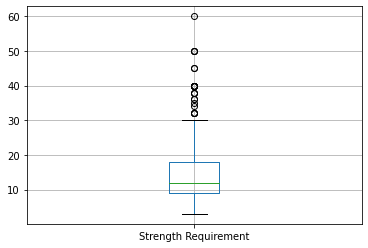

In [55]:
# Filter out rows where X == 0 while keeping original dataset intact
df_Strfiltered = df[df['Strength Requirement'] != 0]
df_Strfiltered.boxplot(column = 'Strength Requirement') #Box plots provide a quick visual representation of the describe function
df_Strfiltered[['Strength Requirement']].describe()

In [56]:
df[df['Strength Requirement'] == 0]  #Check weapons which have zero strength requirement

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Intelligence Requirement,Faith Requirement,Strength Bonus,Dexterity Bonus,Intelligence Bonus,Faith Bonus,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent
36,Storm Ruler,Greatswords,Boss,154/0/0/0/0,50/35/30/30/35,0/0/0,0/0/0/0,D/D/-/-,100,8.0,...,0.0,0.0,D,D,-,-,35,35,0,0
67,Demon's Scar,Curved Swords,Boss,0/0/99/0/0,25/35/65/30/35,0/0/0,0/16/17/17,-/E/D/D,110,0.5,...,17.0,17.0,-,E,D,D,0,10,35,35
168,Dark Hand,Fists,Unique,88/0/0/0/150,65/65/65/65/65,0/0/0,0/0/0/0,C/C/D/D,100,0.0,...,0.0,0.0,C,C,D,D,65,65,35,35
169,Fist,Fists,Regular,20/0/0/0/0,0/0/0/0/0,0/0/0,0/0/0/0,-/-/-/-,100,0.0,...,0.0,0.0,-,-,-,-,0,0,0,0
271,Pyromancy Flame,Pyromancy Flames,Regular,0/0/100/0/0,-/-/-/-/-,0/0/0,0/0/0/0,-/-/C/C,100,0.0,...,0.0,0.0,-,-,C,C,0,0,65,65


Intrestingly, only five weapons have zero strength requirement.
Using the same method, we can filter for the other stat requirements as well.

On the other hand, 110 weapons have no dex scaling


,Dexterity Requirement
count,177.00
mean,14.40
std,4.54
min,7.00
25%,11.00
50%,14.00
75%,18.00
max,40.00


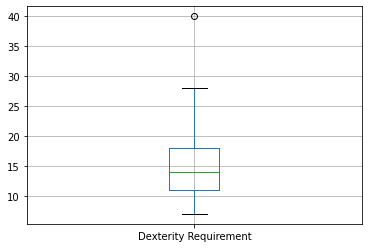

In [57]:
# Filter out rows where X == 0 while keeping original dataset intact
df_Dexfiltered = df[df['Dexterity Requirement'] != 0]
df_Dexfiltered.boxplot(column = 'Dexterity Requirement') #Box plots provide a quick visual representation of the describe function

print('On the other hand,', len(df) - len(df_Dexfiltered),'weapons have no dex scaling')
df_Dexfiltered[['Dexterity Requirement']].describe()

39 weapons have Int scaling


,Intelligence Requirement
count,39.00
mean,13.64
std,4.12
min,9.00
25%,10.00
50%,12.00
75%,16.50
max,26.00


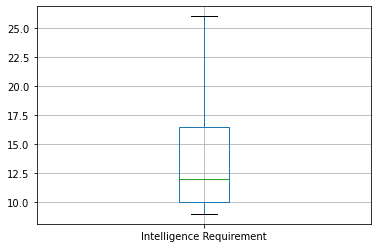

In [58]:
# Filter out rows where X == 0 while keeping original dataset intact
df_Intfiltered = df[df['Intelligence Requirement'] != 0]
df_Intfiltered.boxplot(column = 'Intelligence Requirement') #Box plots provide a quick visual representation of the describe function

print(len(df_Intfiltered),'weapons have Int scaling')
df_Intfiltered[['Intelligence Requirement']].describe()



47 weapons have Faith scaling


,Faith Requirement
count,47.00
mean,14.21
std,4.66
min,9.00
25%,11.50
50%,13.00
75%,16.00
max,30.00


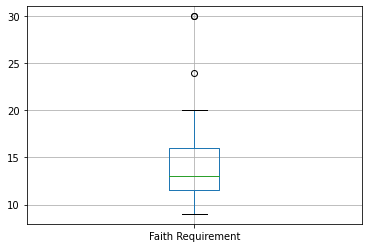

In [59]:
# Filter out rows where X == 0 while keeping original dataset intact
df_Faifiltered = df[df['Faith Requirement'] != 0]
df_Faifiltered.boxplot(column = 'Faith Requirement') #Box plots provide a quick visual representation of the describe function

print(len(df_Faifiltered),'weapons have Faith scaling')
df_Faifiltered[['Faith Requirement']].describe()

Strength appears to be the most important stat for weilding a variety of weapons.\
It has the highest mean requirement of 15, the highest max stat requirment of 60Str and almost every weapon in the game requires at least a tiny amount of strength.

Dex has the next highest mean requirement of 14 and 177 weapons require some amount of dex. 
It is not much of a suprise that the stats that govern physical weapons are vastly overrepresented when comparing the number of physical weapons in the game to the number of magic weapons, with many magical weapons still requiring Str or Dex.\
Most weapons that require Dex fall within the first and third quartile, with only a single weapon requiring a much greater value of dex then the others (40). If a player is only intrested in reaching the minimum stat requirement for the weapon then Dex provides many low value choices.

Intelligence and faith both have a mean requirment of 14, and a vastly reduced number of weapons (39 and 47 respectivly). Similar to dex, most weapons fall within the first and third quartile of their respective stat data. For Faith there are two weapons higher then the 3rd quartile, requiring 30 and 24 Faith.

### Two handing requirements:

A mechanic I have not touched on is two-handing a weapon. When you use two hands to weild a weapon, you sacrifice your ability to hold a second weapon (such as a shield) in your left hand in exchange for a 50% str boost. The category of these end games weapons are predominantly big bulky greatswords and greathammers, and so the reason for such high str requirements is the game expects the player to two hand these weapons until they build up the strength to weild them in one hand.

As mentioned before, wielding a weapon in two hands boosts the players str stat by a flat 50% bonus. So we may find the lowered stat requirements of weapons if the user is willing to give up their left arm.

In [60]:
'''(x / 1.5) + (x % 1.5 > 0)
where x is our strength requirement,
divide by 1.5 as two handing gives a 50% bonus to the strength stat,

(x%1.5 > 0) takes the modulus of the division, if there is any remainder then >0 is true and so the 
bracket evaluates to 1. 
This effectivly rounds up the division even if the decimal point is less then 5, this is useful
because if a weapon has a str requirment of 8.3, the player would need 9 str, not 8.
'''

df['Strength Requirement 2 hand'] = round(df['Strength Requirement']/1.5) +(df['Strength Requirement']%1.5 >0)
df

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Faith Requirement,Strength Bonus,Dexterity Bonus,Intelligence Bonus,Faith Bonus,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent,Strength Requirement 2 hand
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,0.0,E,C,-,-,10,65,0,0,8.0
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,0.0,D,D,-,-,35,35,0,0,8.0
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,0.0,E,E,-,-,10,10,0,0,8.0
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,0.0,E,C,-,-,10,65,0,0,4.0
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,0.0,E,E,-,-,10,10,0,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Saint-tree Bellvine,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/18,E/-/-/C,100,0.5,...,18.0,E,-,-,C,10,0,0,65,2.0
283,Yorshka's Chime,Chimes,Regular,54/0/0/0/0,25/15/10/20/15,0/0/0,3/0/0/30,D/-/-/A,100,0.5,...,30.0,D,-,-,A,35,0,0,120,2.0
284,Priest's Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/10,E/-/-/B,100,0.5,...,10.0,E,-,-,B,10,0,0,90,2.0
285,Follower Torch,Torches,Regular,90/0/65/0/0,45/30/25/25/30,0/0/0,14/0/10/10,D/E/E/E,100,6.0,...,10.0,D,E,E,E,35,10,10,10,10.0


,Strength Requirement 2 hand
count,282.00
mean,10.84
std,6.57
min,2.00
25%,6.00
50%,8.00
75%,12.00
max,40.00


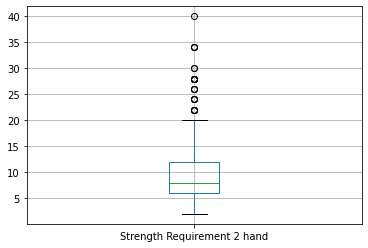

In [61]:
# Filter out rows where X == 0 while keeping original dataset intact
df_Strfiltered2 = df[df['Strength Requirement 2 hand'] != 0]
df_Strfiltered2.boxplot(column = 'Strength Requirement 2 hand') #Box plots provide a quick visual representation of the describe function
df_Strfiltered2[['Strength Requirement 2 hand']].describe()

### Leveling up.

In darksouls 3, all characters start with the same stat total, the choice of class only allocates the initial stat spread which the player may change as they level up.

Hence taking the deprived class as our example, the deprived class starts at level 1 with an even 10 points in every stat. 

Using the total required stat and 10 as a baseline, we can determine how many stat points a player must invest in each stat in order to weild the weapon effectivly.

In [62]:
Requirement = df[['Strength Requirement', "Dexterity Requirement",
                  'Intelligence Requirement', 'Faith Requirement', 'Strength Requirement 2 hand']]
Requirement

Requirement.describe()

,Strength Requirement,Dexterity Requirement,Intelligence Requirement,Faith Requirement,Strength Requirement 2 hand
count,287.00,287.00,287.00,287.00,287.00
mean,15.01,8.88,1.85,2.33,10.65
std,9.96,7.86,4.92,5.59,6.67
min,0.00,0.00,0.00,0.00,0.00
25%,8.00,0.00,0.00,0.00,6.00
50%,12.00,10.00,0.00,0.00,8.00
75%,18.00,15.00,0.00,0.00,12.00
max,60.00,40.00,26.00,30.00,40.00


In [63]:
# Subtract 10 from values in column 'A' if greater than or equal to 10
# Store new values in new columns to not modify the old columns
df['Str lvls'] = df.loc[df['Strength Requirement'] >= 10, 'Strength Requirement'] - 10
df['Dex lvls'] = df.loc[df['Dexterity Requirement'] >= 10, 'Dexterity Requirement'] - 10
df['Int lvls'] = df.loc[df['Intelligence Requirement'] >= 10, 'Intelligence Requirement'] - 10
df['Fai lvls'] = df.loc[df['Faith Requirement'] >= 10, 'Faith Requirement'] - 10
df['Str lvls 2 hand'] = df.loc[df['Strength Requirement 2 hand'] >= 10, 'Strength Requirement 2 hand'] - 10


LvlRequirement = df[['Str lvls', "Dex lvls", 'Int lvls', 'Fai lvls', 'Str lvls 2 hand']]


LvlRequirement.describe()

,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand
count,202.00,158.00,35.00,43.00,135.00
mean,8.69,5.15,4.17,4.70,5.67
std,9.63,4.21,4.02,4.58,6.48
min,0.00,0.00,0.00,0.00,0.00
25%,2.00,2.00,1.50,2.00,2.00
50%,6.00,4.00,2.00,4.00,2.00
75%,11.00,8.00,7.50,6.00,10.00
max,50.00,30.00,16.00,20.00,30.00


Unsurpisingly, the mean number of lvls required for each stat is similar to the mean stat requirement -10.

We see that the mean str lvl is 9 instead of 5. This is because we have filtered out many of the low str requirement weapons and so only looking at 202 weapons for Str instead of 282.

### Total level requirement:

Define a column which describes the total number of level ups a player must invest to use the weapon.


In [64]:
LvlRequirement = df[['Str lvls', "Dex lvls", 'Int lvls', 'Fai lvls']]
df['Total Lvl Requirement'] = LvlRequirement.sum(axis=1)
df['Total Lvl Requirement']
df

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent,Strength Requirement 2 hand,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,65,0,0,8.0,0.0,NaN,NaN,NaN,NaN,0.0
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,35,0,0,8.0,0.0,8.0,NaN,NaN,NaN,8.0
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,10,0,0,8.0,2.0,6.0,NaN,NaN,NaN,8.0
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,65,0,0,4.0,NaN,NaN,NaN,NaN,NaN,0.0
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,10,0,0,4.0,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Saint-tree Bellvine,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/18,E/-/-/C,100,0.5,...,0,0,65,2.0,NaN,NaN,NaN,8.0,NaN,8.0
283,Yorshka's Chime,Chimes,Regular,54/0/0/0/0,25/15/10/20/15,0/0/0,3/0/0/30,D/-/-/A,100,0.5,...,0,0,120,2.0,NaN,NaN,NaN,20.0,NaN,20.0
284,Priest's Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/10,E/-/-/B,100,0.5,...,0,0,90,2.0,NaN,NaN,NaN,0.0,NaN,0.0
285,Follower Torch,Torches,Regular,90/0/65/0/0,45/30/25/25/30,0/0/0,14/0/10/10,D/E/E/E,100,6.0,...,10,10,10,10.0,4.0,NaN,0.0,0.0,0.0,4.0


In [65]:
df[['Total Lvl Requirement']].describe()

,Total Lvl Requirement
count,287.00
mean,10.17
std,9.66
min,0.00
25%,2.00
50%,8.00
75%,14.00
max,60.00


The mean total lvl requirement of all the weapons is 10. Due to the high max requirment of 60, a better measure would be the midpoint, 8. This seems reasonable from a gameplay perspective to have most of your weapons have a low stat requirement as investing in non damage stats are just as important for the player to balance their level up points.

### How early can we use these weapons?


Now that we have the stat points needed to be invested to weild each weapon, we can classify the weapons based on how early the player can weild them. 

* Class early game as needing 0-10 lvl ups
* Mid game needing 11-30
* End game needing 31-90

This does not take into consideration the endurance required to boost equip load as heavier weapons may be weilded by wearing lighter armour.

This also does not take into consideration the actual point in gameplay of each weapon which dictates the point the player may actually obtain it, and so some later boss weapons may be counted as "early game" for a low stat investment.

Again it should be stated that we are basing this analysis off a player who chose the "Deprived class", which has a well balanced stat distribution of 10 points in each stat. A player who chose the knight class would start with 13 str, 12dex, 9 Fai and 9dex, and so would have slightly different lvl requirements.

In [66]:
df['Lvl category'] = pd.cut(df['Total Lvl Requirement'], [-1, 10, 30, 90], labels=['Start Game', 'Mid Game', 'End Game'])

df[df['Lvl category'] == 'Start Game']
df[df['Lvl category'] == 'Mid Game']
df[df['Lvl category'] == 'End Game']

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Intelligence Bonus Percent,Faith Bonus Percent,Strength Requirement 2 hand,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category
48,Fume Ultra Greatsword,Ultra Greatswords,Unique,149/0/0/0/0,80/55/65/60/65,0/0/0,50/10/0/0,A/E/-/-,100,25.5,...,0,0,34.0,40.0,0.0,NaN,NaN,24.0,40.0,End Game
50,Ringed Knight Paired Greatswords,Ultra Greatswords,Unique,185/0/11/0/0,50/40/35/35/40,0/0/0,40/15/0/0,C/E/E/E,100,22.5,...,10,10,28.0,30.0,5.0,NaN,NaN,18.0,35.0,End Game
76,Frayed Blade,Katanas,Boss,101/0/0/0/41,45/25/30/15/40,0/34/0,11/40/0/0,E/B/-/-,100,8.0,...,0,0,8.0,1.0,30.0,NaN,NaN,NaN,31.0,End Game
103,Black Knight Greataxe,Greataxes,Unique,201/0/0/0/0,60/45/50/40/45,0/0/0,36/18/0/0,C/D/-/-,100,19.5,...,0,0,24.0,26.0,8.0,NaN,NaN,14.0,34.0,End Game
120,Ledo's Great Hammer,Great Hammers,Unique,170/0/0/0/0,85/55/60/55/55,0/0/0,60/0/0/0,B/-/-/-,100,28.0,...,0,0,40.0,50.0,NaN,NaN,NaN,30.0,50.0,End Game
121,Morne's Great Hammer,Great Hammers,Unique,200/0/0/0/0,70/50/45/45/50,0/0/0,50/0/0/30,D/-/-/D,100,24.0,...,0,35,34.0,40.0,NaN,NaN,20.0,24.0,60.0,End Game
126,Smough's Great Hammer,Great Hammers,Unique,205/0/0/0/0,70/50/45/45/50,0/0/0,45/0/0/0,C/-/-/-,100,24.0,...,0,0,30.0,35.0,NaN,NaN,NaN,20.0,35.0,End Game
244,Giant Door Shield,Greatshields,Regular,107/0/0/0/0,100/75/45/80/75,0/0/0,45/0/0/0,C/-/-/-,100,21.5,...,0,0,30.0,35.0,NaN,NaN,NaN,20.0,35.0,End Game
255,Moaning Shield,Greatshields,Unique,136/0/0/0/0,100/81/69/76/67,0/0/0,50/0/0/0,D/-/-/-,100,21.5,...,0,0,34.0,40.0,NaN,NaN,NaN,24.0,40.0,End Game


Out of intrest I have highlighted all the weapons with the highest level up requirements. These weapons are interesting because a player must invest a lot of level ups into a single stat in order to weild them, making them difficult to use even if obtained early. 

Take Ledo's Great Hammer for example, it has a total lvl up requirement of 50 points into strength. \
A player can not afford to place their first 50 level ups all into strength, as their health, endurance and carrying capacity would suffer, and so the true level requirment is much higher then 50.

Other then the Frayed blade requiring 40dex, for all these end game weapons the stat requirement that's so high is strength. 

Repeat for the 2-handed requirements, to see how the weapon classifications change accounting for players using the two hand mechanic.

In [67]:
LvlRequirement2hand = df[['Str lvls 2 hand', "Dex lvls", 'Int lvls', 'Fai lvls']]

df['Total Lvl Requirement 2 hand'] = LvlRequirement2hand.sum(axis=1)


df['Lvl category 2 hand'] = pd.cut(df['Total Lvl Requirement 2 hand'], [-1, 10, 30, 90], labels=['Start Game (twoH)', 'Mid Game(twoH)', 'End Game(twoH)'])

df[df['Lvl category 2 hand'] == 'Start Game(twoH)']
df[df['Lvl category 2 hand'] == 'Mid Game(twoH)']
df[df['Lvl category 2 hand'] == 'End Game(twoH)']

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Strength Requirement 2 hand,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand
121,Morne's Great Hammer,Great Hammers,Unique,200/0/0/0/0,70/50/45/45/50,0/0/0,50/0/0/30,D/-/-/D,100,24.0,...,34.0,40.0,NaN,NaN,20.0,24.0,60.0,End Game,44.0,End Game(twoH)


When two handling weapons, the stat investment drops massively as strength makes up the most of the level ups<br>
The only weapon that still fits the end game category is Morne's Great Hammer, which has a high strength requirement of 50(34) and a Faith investment of 30.


#### Finally, output df again to view the dataframe with all the edited columns

In [68]:
df

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Strength Requirement 2 hand,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand
0,Rotten Ghru Dagger,Daggers,Regular,64/0/0/0/0,35/20/15/15/20,36/0/0,10/8/0/0,E/C/-/-,100,2.0,...,8.0,0.0,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH)
1,Brigand Twindaggers,Daggers,Regular,70/0/0/0/0,35/20/15/15/20,0/0/0,10/18/0/0,D/D/-/-,125,2.5,...,8.0,0.0,8.0,NaN,NaN,NaN,8.0,Start Game,8.0,Start Game (twoH)
2,Corvian Greatknife,Daggers,Regular,93/0/0/0/0,40/25/20/20/25,0/0/0,12/16/0/0,E/E/-/-,110,2.5,...,8.0,2.0,6.0,NaN,NaN,NaN,8.0,Start Game,6.0,Start Game (twoH)
3,Dagger,Daggers,Regular,65/0/0/0/0,35/20/15/15/20,0/0/0,5/9/0/0,E/C/-/-,130,1.5,...,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH)
4,Handmaid's Dagger,Daggers,Regular,85/0/0/0/0,30/20/15/15/20,0/0/0,4/8/0/0,E/E/-/-,110,0.5,...,4.0,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,Saint-tree Bellvine,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/18,E/-/-/C,100,0.5,...,2.0,NaN,NaN,NaN,8.0,NaN,8.0,Start Game,8.0,Start Game (twoH)
283,Yorshka's Chime,Chimes,Regular,54/0/0/0/0,25/15/10/20/15,0/0/0,3/0/0/30,D/-/-/A,100,0.5,...,2.0,NaN,NaN,NaN,20.0,NaN,20.0,Mid Game,20.0,Mid Game(twoH)
284,Priest's Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/10,E/-/-/B,100,0.5,...,2.0,NaN,NaN,NaN,0.0,NaN,0.0,Start Game,0.0,Start Game (twoH)
285,Follower Torch,Torches,Regular,90/0/65/0/0,45/30/25/25/30,0/0/0,14/0/10/10,D/E/E/E,100,6.0,...,10.0,4.0,NaN,0.0,0.0,0.0,4.0,Start Game,0.0,Start Game (twoH)


### Keeping track of all our headings:

In [69]:
df.keys()

Index(['Name', 'Category', 'Reinforcement', 'Damage', 'Damage Reduction',
       'Aux Effects', 'Stat Requirements', 'Stat Bonuses', 'Critical',
       'Weight', 'Stability', 'Durability', 'Spell Buff', 'Range', 'Buffable',
       'Infusable', 'Physical damage', 'Magic damage', 'Fire damage',
       'Lightning damage', 'Dark damage', 'Total damage', 'Physical Reduction',
       'Magic Reduction', 'Fire Reduction', 'Lightning Reduction',
       'Dark Reduction', 'Poison', 'Bleed', 'Frostbite',
       'Strength Requirement', 'Dexterity Requirement',
       'Intelligence Requirement', 'Faith Requirement', 'Strength Bonus',
       'Dexterity Bonus', 'Intelligence Bonus', 'Faith Bonus',
       'Strength Bonus Percent', 'Dexterity Bonus Percent',
       'Intelligence Bonus Percent', 'Faith Bonus Percent',
       'Strength Requirement 2 hand', 'Str lvls', 'Dex lvls', 'Int lvls',
       'Fai lvls', 'Str lvls 2 hand', 'Total Lvl Requirement', 'Lvl category',
       'Total Lvl Requirement 2 hand

# Defining our weapon groups <a id='Defining_Weapon_Groups'></a>
As stated earlier, it is better to wait until after the df has been edited fully before defining our new smaller groups. This way all the new columns are carried forwards. 

We will redefine Shields the same way as in our [Category explored section](#Category_explored)

This time, we will define a function that can take many inputs of Category names.

I will also drop columns from data groups where applicable.
i.e only want to compare range for weapon categories that actually have range.

In [246]:
def in_or_not(dataframe, Column, Rows):
    Mask = dataframe[Column].isin(Rows)
    Group = dataframe[Mask]   # Filters dataframe to only include rows
    nonGroup = dataframe[~Mask]  # Filters dataframe to exclude rows
    return(Group, nonGroup)     # Returns both to be called upon

inResult = in_or_not(df,'Category', ['Small Shields', 'Normal Shields', 'Greatshields']) 

# No Shield has a Range or Spell Buff stat, can drop those columns.
Shields, nonShields = inResult[0].drop(['Range', 'Spell Buff'], axis=1), inResult[1]

# Be careful choosing which columns to drop. No Shield has a Frostbite stat, but there are Shields with Bleed and Poison. 
# Hence it is useful to keep Frostbite column to compare auxiliary effects.
Shields

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand,Total Stat Requirement
195,Elkhorn Round Shield,Small Shields,Regular,69/0/0/0/0,59/63/33/36/25,0/0/0,8/0/0/0,E/-/-/-,100,1.5,...,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH),8.0
196,Hawkwood's Shield,Small Shields,Regular,72/0/0/0/0,56/35/58/45/55,0/0/0,5/0/0/0,E/-/-/-,100,2.0,...,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH),5.0
197,Iron Round Shield,Small Shields,Regular,71/0/0/0/0,67/44/38/19/36,0/0/0,5/0/0/0,E/-/-/-,100,2.0,...,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH),5.0
198,Warrior's Round Shield,Small Shields,Regular,74/0/0/0/0,62/68/45/46/36,0/0/0,10/0/0/0,E/-/-/-,100,1.5,...,0.0,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH),10.0
199,Eastern Iron Shield,Small Shields,Regular,81/0/0/0/0,85/40/41/22/39,0/0/0,8/0/0/0,D/-/-/-,100,3.0,...,NaN,NaN,NaN,NaN,NaN,0.0,Start Game,0.0,Start Game (twoH),8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,Stone Greatshield,Greatshields,Regular,115/0/0/0/0,100/75/71/71/75,0/0/0,38/0/0/0,D/-/-/-,100,18.0,...,28.0,NaN,NaN,NaN,16.0,28.0,Mid Game,16.0,Mid Game(twoH),38.0
254,Havel's Greatshield,Greatshields,Unique,143/0/0/0/0,100/83/83/82/83,0/0/0,40/0/0/0,D/-/-/-,100,28.0,...,30.0,NaN,NaN,NaN,18.0,30.0,Mid Game,18.0,Mid Game(twoH),40.0
255,Moaning Shield,Greatshields,Unique,136/0/0/0/0,100/81/69/76/67,0/0/0,50/0/0/0,D/-/-/-,100,21.5,...,40.0,NaN,NaN,NaN,24.0,40.0,End Game,24.0,Mid Game(twoH),50.0
256,Greatshield of Glory,Greatshields,Unique,134/0/0/0/0,100/70/65/52/63,0/0/0,40/0/0/0,D/-/-/-,100,18.5,...,30.0,NaN,NaN,NaN,18.0,30.0,Mid Game,18.0,Mid Game(twoH),40.0


All weapon categories can be used to block attacks except bows, greatbows and crossbows, so can drop defence stats from ranged table as well as Spell Buff again.<br>
Can also drop Aux effects as no bows have any Aux effects

In [251]:
# See our generalised function works for classifying groups quickly
inResult= in_or_not(df,'Category', ['Bows', 'Greatbows', 'Crossbows'])
Ranged, nonRanged = inResult[0].drop(['Spell Buff', 'Poison','Bleed','Frostbite', 'Stability',
                          'Physical Reduction', 'Magic Reduction', 'Fire Reduction', 
                          'Lightning Reduction','Dark Reduction'], axis=1), inResult[1]
Ranged

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand,Total Stat Requirement
178,Dragonrider Bow,Bows,Boss,110/0/0/0/0,-/-/-/-/-,0/0/0,19/15/0/0,D/E/-/-,100,6.5,...,9.0,5.0,NaN,NaN,4.0,14.0,Mid Game,9.0,Start Game (twoH),34.0
179,Short Bow,Bows,Regular,77/0/0/0/0,-/-/-/-/-,0/0/0,7/12/0/0,E/D/-/-,100,2.0,...,NaN,2.0,NaN,NaN,NaN,2.0,Start Game,2.0,Start Game (twoH),19.0
180,Darkmoon Longbow,Bows,Boss,36/44/0/0/0,-/-/-/-/-,0/0/0,7/16/10/0,-/E/C/-,100,4.5,...,NaN,6.0,0.0,NaN,NaN,6.0,Start Game,6.0,Start Game (twoH),33.0
181,Composite Bow,Bows,Regular,73/0/0/0/0,-/-/-/-/-,0/0/0,12/12/0/0,D/D/-/-,100,3.5,...,2.0,2.0,NaN,NaN,NaN,4.0,Start Game,2.0,Start Game (twoH),24.0
182,Longbow,Bows,Regular,82/0/0/0/0,-/-/-/-/-,0/0/0,9/14/0/0,E/D/-/-,100,4.0,...,NaN,4.0,NaN,NaN,NaN,4.0,Start Game,4.0,Start Game (twoH),23.0
183,White Birch Bow,Bows,Unique,82/0/0/0/0,-/-/-/-/-,0/0/0,8/20/0/0,E/D/-/-,100,2.5,...,NaN,10.0,NaN,NaN,NaN,10.0,Start Game,10.0,Start Game (twoH),28.0
184,Black Bow of Pharis,Bows,Regular,67/0/0/0/0,-/-/-/-/-,0/0/0,9/18/0/0,E/C/-/-,100,3.0,...,NaN,8.0,NaN,NaN,NaN,8.0,Start Game,8.0,Start Game (twoH),27.0
185,Onislayer Greatbow,Greatbows,Unique,111/0/0/0/0,0/0/0/0/0,0/0/0,18/24/0/0,E/C/-/-,100,7.5,...,8.0,14.0,NaN,NaN,2.0,22.0,Mid Game,16.0,Mid Game(twoH),42.0
186,Millwood Greatbow,Greatbows,Unique,139/0/0/0/0,0/0/0/0/0,0/0/0,28/12/0/0,C/E/-/-,100,9.0,...,18.0,2.0,NaN,NaN,10.0,20.0,Mid Game,12.0,Mid Game(twoH),40.0
187,Dragonslayer Greatbow,Greatbows,Unique,126/0/0/0/0,0/0/0/0/0,0/0/0,20/20/0/0,D/D/-/-,100,10.0,...,10.0,10.0,NaN,NaN,4.0,20.0,Mid Game,14.0,Mid Game(twoH),40.0


In [253]:
# Magic types are easiest to group together after shields 
# I will call Talismans and Chimes holy staffs as we expect them to scale off faith bar outliers
inResult= in_or_not(df, 'Category', ['Talismans', 'Chimes'])
HolyStaff, nonHolyStaff = inResult[0].drop(['Range', 'Poison','Bleed','Frostbite'], axis=1), inResult[1]

# Now group the different magic weapons into one data frame. this may or may not provide some useful comparisons
inResult= in_or_not(df, 'Category', ['Talismans', 'Chimes', 'Staves', 'Pyromancy Flames'])
Staff, nonStaff = inResult[0].drop(['Range', 'Poison','Bleed','Frostbite'], axis=1), inResult[1]

# Fists and claws generally pair well together:
inResult= in_or_not(df,'Category', ['Fists', 'Claws'])
Punch, nonPunch = inResult[0].drop(['Range', 'Spell Buff'], axis=1), inResult[1]

# Most of the other weapon types are less closesly affiliated, but may still be grouped
inResult= in_or_not(df,'Category', ['Greatswords', 'Curved Greatswords', 'Ultra Greatswords', 
                                     'Straight Swords', 'Curved Swords', 'Daggers', 
                                     'Thrusting Swords','Katanas' ])
Swords, nonSwords = inResult[0].drop(['Range'], axis=1), inResult[1]
Swords['Category'].unique()


# finally it makes sense to group the weapons by melee as we have magic, ranged and shields already. 
# Quicker to define what isnt melee and then use .unique() to check
inResult= in_or_not(df, 'Category', ['Talismans', 'Chimes', 'Staves', 'Pyromancy Flames',
                                   'Bows', 'Greatbows', 'Crossbows',
                                   'Small Shields', 'Normal Shields', 'Greatshields'])
Melee  = inResult[1].drop(['Range'], axis=1)
Melee['Category'].unique()


['Daggers', 'Straight Swords', 'Greatswords', 'Ultra Greatswords', 'Curved Swords', ..., 'Reapers', 'Fists', 'Claws', 'Whips', 'Torches']
Length: 20
Categories (20, object): ['Daggers' < 'Straight Swords' < 'Greatswords' < 'Ultra Greatswords' ... 'Fists' < 'Claws' < 'Whips' < 'Torches']

In [254]:
df['Category'].unique()

['Daggers', 'Straight Swords', 'Greatswords', 'Ultra Greatswords', 'Curved Swords', ..., 'Staves', 'Pyromancy Flames', 'Talismans', 'Chimes', 'Torches']
Length: 30
Categories (30, object): ['Daggers' < 'Straight Swords' < 'Greatswords' < 'Ultra Greatswords' ... 'Pyromancy Flames' < 'Talismans' < 'Chimes' < 'Torches']

I now have a series of broad classes that encompess different categories. \
Shields, Holy_staff, Staff, Punch, Ranger, Swords and Melee.

The dataframe df itself remains unchanged.


## Mean by Categories!
There are now many many values to keep track of within the dataframe.<br>
If a player wants to compare weapon categories, a quick way to do this would be to define a table grouping all the weapons by 'Category' and displaying the mean value of each column.<br>

To avoid zero's creating unfairly weighted means, I have used the <code>.replace(0, np.NaN)</code> function to remove zeros from the data before the mean is calculated. <br>
This allows one to view from the table that the mean value of Greatswords that do magic damage is 96, instead of a less useful value of 18 due to the vast majority of Greatswords being non-magic.


In [278]:
dfByCatMean = df[['Physical damage','Magic damage','Lightning damage','Fire damage', 'Dark damage', 'Total damage',
                  'Physical Reduction', 'Magic Reduction', 'Fire Reduction', 'Lightning Reduction', 'Dark Reduction', 
                  'Poison', 'Bleed', 'Frostbite',
                  'Strength Requirement', 'Dexterity Requirement',
                  'Intelligence Requirement', 'Faith Requirement', 'Total Lvl Requirement', 'Total Lvl Requirement 2 hand',
                  'Strength Bonus Percent', 'Dexterity Bonus Percent',
                  'Intelligence Bonus Percent', 'Faith Bonus Percent',
                  'Critical', 'Weight', 'Stability', 'Durability', 'Spell Buff', 'Range', "Category"]].replace(0, np.NaN).groupby("Category").mean()
dfByCatMean

,Physical damage,Magic damage,Lightning damage,Fire damage,Dark damage,Total damage,Physical Reduction,Magic Reduction,Fire Reduction,Lightning Reduction,...,Strength Bonus Percent,Dexterity Bonus Percent,Intelligence Bonus Percent,Faith Bonus Percent,Critical,Weight,Stability,Durability,Spell Buff,Range
Category,,,,,,,,,,,,,,,,,,,,,
Daggers,75.38,67.00,NaN,NaN,22.0,82.23,34.62,20.38,15.38,15.38,...,15.77,40.77,22.5,10.00,111.15,1.65,15.77,47.31,NaN,NaN
Straight Swords,108.82,77.00,NaN,11.0,NaN,114.00,46.76,31.76,26.18,25.88,...,38.82,33.82,37.5,23.75,101.18,3.53,32.94,71.47,192.00,NaN
Greatswords,129.94,95.67,71.0,86.0,115.0,170.25,51.25,37.19,31.88,30.94,...,37.50,32.00,50.0,35.00,100.00,8.91,37.19,75.94,NaN,NaN
Ultra Greatswords,153.45,NaN,87.0,45.0,NaN,169.55,58.64,45.91,42.27,41.82,...,53.64,33.64,22.5,22.50,100.00,15.77,44.55,105.00,NaN,NaN
Curved Swords,100.21,70.00,NaN,80.5,NaN,113.60,42.00,32.00,29.00,26.00,...,23.46,52.67,35.0,35.00,100.67,3.80,29.33,65.67,202.00,NaN
Katanas,113.12,NaN,NaN,NaN,41.0,118.25,46.25,26.25,22.50,20.62,...,13.12,67.50,NaN,NaN,100.00,6.44,31.25,33.75,NaN,NaN
Curved Greatswords,140.00,NaN,NaN,NaN,NaN,140.00,57.00,45.00,39.00,39.00,...,41.00,53.00,NaN,NaN,100.00,13.10,44.00,105.00,NaN,NaN
Thrusting Swords,94.33,82.00,NaN,NaN,NaN,108.00,38.33,23.33,16.67,16.67,...,22.50,45.83,65.0,NaN,110.00,2.92,16.67,60.00,NaN,NaN
Axes,120.10,NaN,105.0,NaN,NaN,130.60,47.00,32.00,26.00,26.00,...,46.50,26.67,NaN,NaN,100.00,4.75,32.00,74.50,NaN,NaN


In [75]:
dfByCatMean[['Total Lvl Requirement', 'Total Lvl Requirement 2 hand']]

,Total Lvl Requirement,Total Lvl Requirement 2 hand
Category,,
Daggers,5.44,5.22
Straight Swords,7.58,5.83
Greatswords,13.47,8.47
Ultra Greatswords,20.64,12.36
Curved Swords,8.40,7.40
Katanas,16.62,13.88
Curved Greatswords,20.40,14.20
Thrusting Swords,6.17,5.67
Axes,8.50,5.40


---
# Data plotting:

i.e bar charts.
* plot your data and explain things.
* note thought process
* dont need to go through all your questions, useful to note them down anyways.


histograms, fine grain data vs small bin count.


If plots are messy, can we filter data so a sensible amount is chosen on screen at once?
* what we learn from our data
* why we have chosen to filter/compare the data the way we have,




If we start with a question, could answer it in a conclusion at the end. \
take the data and use it to ask new data that may not be answered by the data.

the priority of the project is investigating your thought process.

doesnt need to be a formal conclusion, could just be your overall findings with the data.




### Taking it further:

Linear regression. \
choose a column to predict based on another column and see how well it predicts.



### ~10-15 min talk with 5min for questions
### 26th Feburary

## What makes a good dataset?

scale of the numerical data

# Data Plotting

Useful for visulising large amounts of data, showing patterns within the data that are not immediatly obvious from looking through a table. Anomalous results will stand out more in graph format.

## Weapon Categories

Text(0.5, 0.98, 'Weapon Categories')

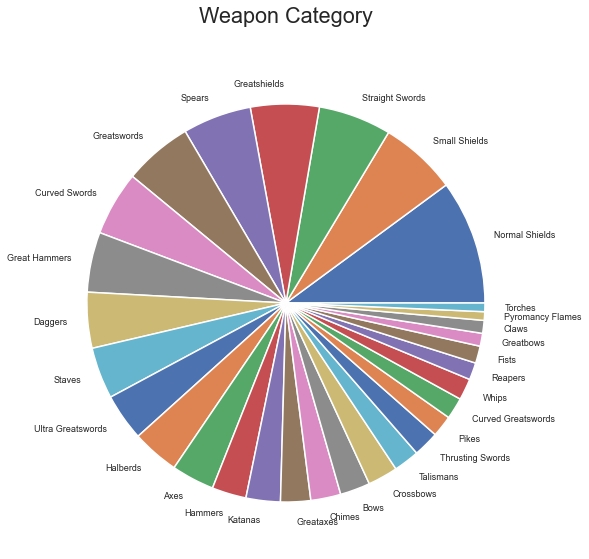

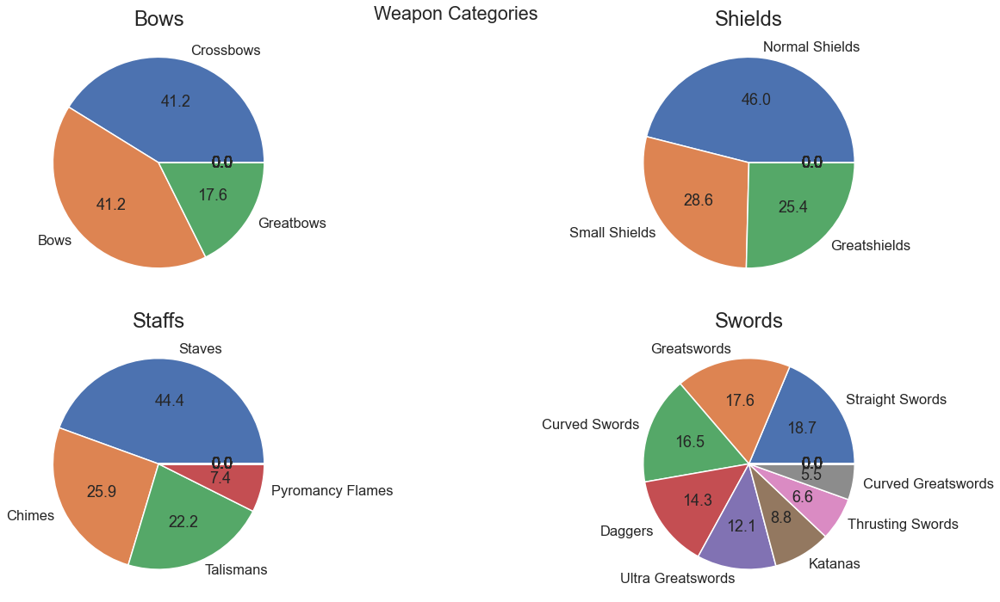

In [77]:
# For the type column we can use a pie chart for example.

sns.set(context='talk') #Style

# Set figure
fig = plt.figure(figsize=(16, 8))
df['Category'].value_counts().plot(kind='pie', textprops={'fontsize': 9})
fig.suptitle('Weapon Category')

# A pie chart doesnt need a label along x-y axis if we give it a neater title
plt.xlabel('')
plt.ylabel('')
# Removing unecessary white space.
plt.tight_layout()

# ===============================================================
# Plotting multiple pie charts in one figure.
# Plot weapon categories within the broader groups defined earlier.
# Defining the figure and axes.
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

# Creating the pie charts on their respective axes.
Ranged['Category'].value_counts().plot(kind='pie', ax=axes[0,0], autopct='%.1f')
Shields['Category'].value_counts().plot(kind='pie', ax=axes[0,1], autopct='%.1f')
Staff['Category'].value_counts().plot(kind='pie', ax=axes[1,0], autopct='%.1f')
Swords['Category'].value_counts().plot(kind='pie', ax=axes[1,1], autopct='%.1f')

# "Removing" the y axis labels.
axes[0,0].set_ylabel('')
axes[0,1].set_ylabel('')
axes[1,0].set_ylabel('')
axes[1,1].set_ylabel('')
axes[0,0].set_title('Bows', fontsize = 24)
axes[0,1].set_title('Shields', fontsize = 24)
axes[1,0].set_title('Staffs', fontsize = 24)
axes[1,1].set_title('Swords', fontsize = 24)

# Removing unecessary white space.
plt.tight_layout()
# Adding an overall title.
fig.suptitle('Weapon Categories')

We can see there is an equal proportion of crossbows to bows within the game, with Greatbows making up the small remainder. For shields, 1/4 make up Greatshields and small shields each, and the remaining half makes up Normal shields.

This is useful information for a player to know that if they choose to specalise in one category, how many options will be available to them relative to similar categories.

A pie chart is useful for showing what proportion of each category makes up the whole. However, it does not display the actual count. Furthermore, so many different categories quickly gets harder to read as the slices get smaller. Instead a histogram may be better for displaying counts.

Reading from data set directly such as \
<code>sns.barplot(y =df['Category'].unique(),x = df['Category'].value_counts() )</code><br>
leads to the counts being out of order with the weapon category, as value_counts lists from most frequent to least freqeunt, and .unique takes the categories in order used in the data frame.

need to reset the index to match the value count to the category

In weapon count, the weapon category has become the new index and the count is labeled as 'Category'

In [ ]:
#Horizontal histogram better for reading so many labels

weaponCounts = df['Category'].value_counts().reset_index()

# Set figure and plot
plt.figure(figsize=(12, 12))
sns.barplot(x=weaponCounts.values, y=weaponCounts.index, orient='h')

plt.xlabel('Count')
plt.ylabel('Weapon Category')
plt.title('Category Counts')

plt.show()

In [79]:
weaponCounts.describe()

count    30.00
mean      9.57
std       6.11
min       2.00
25%       5.00
50%       7.50
75%      13.75
max      29.00
Name: Category, dtype: float64

From this histogram we can see that most of the Categories have between 8-16 weapons with normal shields taking up a disproportionate 29 weapons. \
The lowest number of weapons in any category is 2, shared by Torches and Pyromancy Flames.

The describe function compliments the visual representation on the graph.<br>
From describe we see that the mean value count of weapon categories is 9.6, which matches what can be seen from a glance of the barplot.


## Weight distribution:
Next I will investigate the weight distribution of weapons.

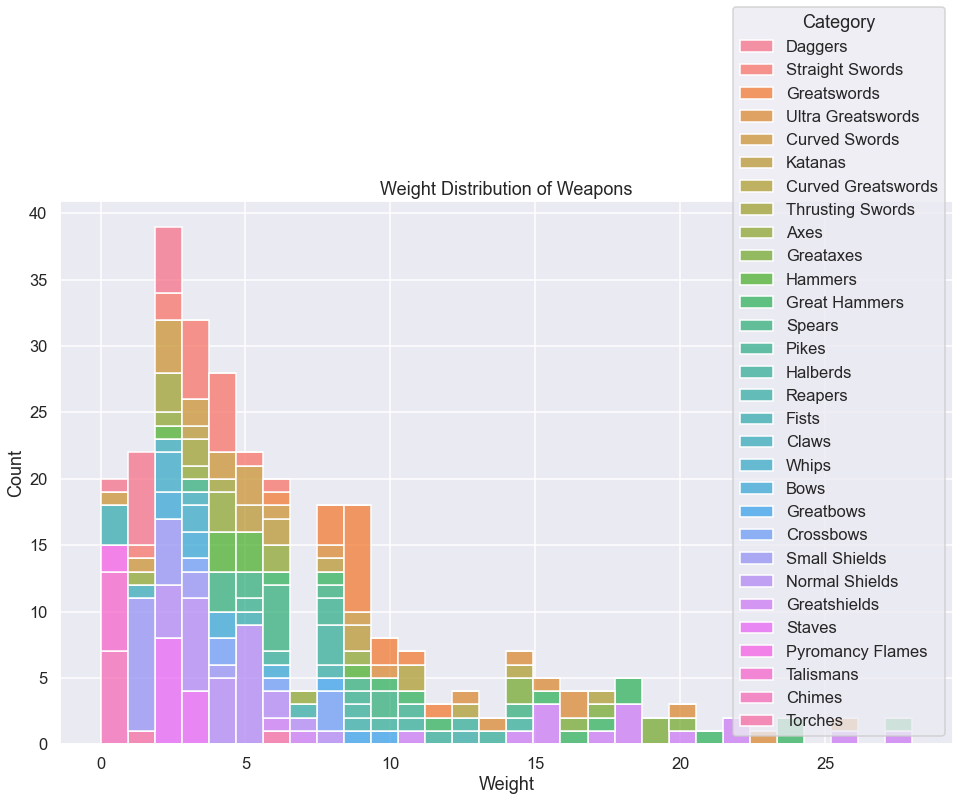

In [80]:
plt.figure(figsize=(16, 10))
sns.histplot(data=df, x='Weight', bins=30, hue = "Category", multiple="stack")
plt.title('Weight Distribution of Weapons')
plt.show()

In [81]:
len(df['Category'].unique())

30

### Plotly vs Seaborn:
* Seaborn builds off of matplotlib, it is simpler to use and has a nice looking default colour scheme.<br>
* Plotly has interactive features that allow for better visulisation of data. <br>

For large amounts of data (i.e 30 weapon categories), the defualt colour schemes start looping through the same ten discrete colour values and it becomes ambiguous.

At first I tried making a set of 30 discrete colours by sampling from continous colour scales, but this made the plot hard to read as categories close together would have too similar a colour.

<code>rainbowColours = px.colors.sample_colorscale('rainbow', 30)  # Sample 30 colors from the rainbow scale</code>

Rainbow Colour scale made distinguishing between certain close yellows difficult

Next I looked into existing discrete palletes and realised I could define my own palette as a mix of two palletes, one with 24 colours and one with 8 colours to make a pallete with 32 colours.

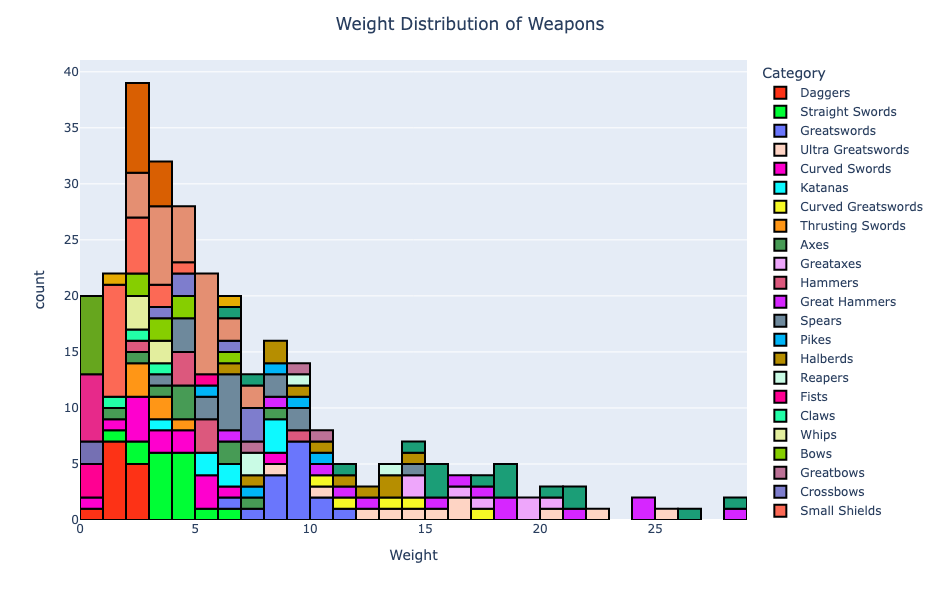

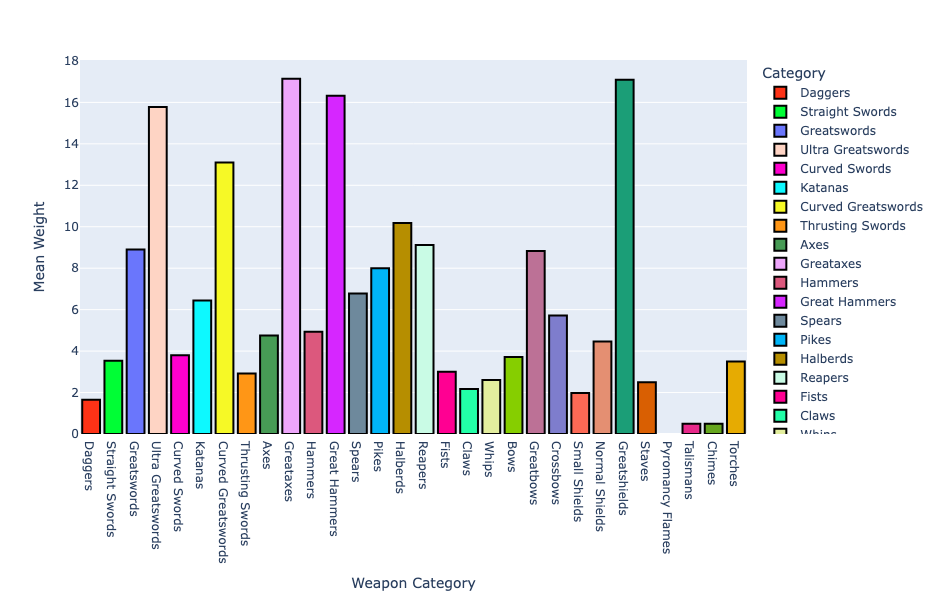

<Figure size 1152x720 with 0 Axes>

<Figure size 1152x720 with 0 Axes>

In [82]:
CatColours = px.colors.qualitative.Light24 + px.colors.qualitative.Dark2
plt.figure(figsize=(16, 10))
fig = px.histogram(df, x='Weight', color = "Category", nbins=40,
                   color_discrete_sequence= CatColours)

# Change the figure size
fig.update_layout(width=900, height=600,
                 title_text='Weight Distribution of Weapons', title_x=0.5)

fig.update_traces(marker=dict(line=dict(color='black', width=2))) # Border color and width

fig.show()


plt.figure(figsize=(16, 10))
fig = px.bar(dfByCatMean, y='Weight', color = dfByCatMean.index,
                   color_discrete_sequence= CatColours)


# Change the figure size
fig.update_layout(width=900, height=600,
                 yaxis_title="Mean Weight", xaxis_title="Weapon Category")

fig.update_traces(marker=dict(line=dict(color='black', width=2))) # Border color and width

fig.show()

We see there is a peak of weight around 2.5 weight, with the distribution trailing off as weight increases to a max of 28.<br>

We can also filter for different weapon categories and compare the weight distirbution of the weapons within them.<br>
For example looking at the shields, as could be inferred from the names,<br>
the weight of Small < Normal < Great.

Melee weapon clases (purple-blue) are spread throughout the entire distribution due to the sheer numbers they make up of the data. Shields, spells tools and ranged weapons tend to fall under their own narrower distributions within the data as a whole.

All the magic tools fall within a weight category of less than 5, and so mage players will know they do not have to invest as many of their level up points into vitality as a player weilding a heavy sword or shield.

I also plotted the Mean weight distribution of the weapons to highlight the difference between weapon classes.<br>
As could be expected, 'Great' weapons have a higher mean weight.<br>
What is less obvious from the histogram but shown clearly on the Barplot is that the Pyromancy flames have a mean weight of zero.

### lvl category

Text(0.5, 0, 'Total level requirement')

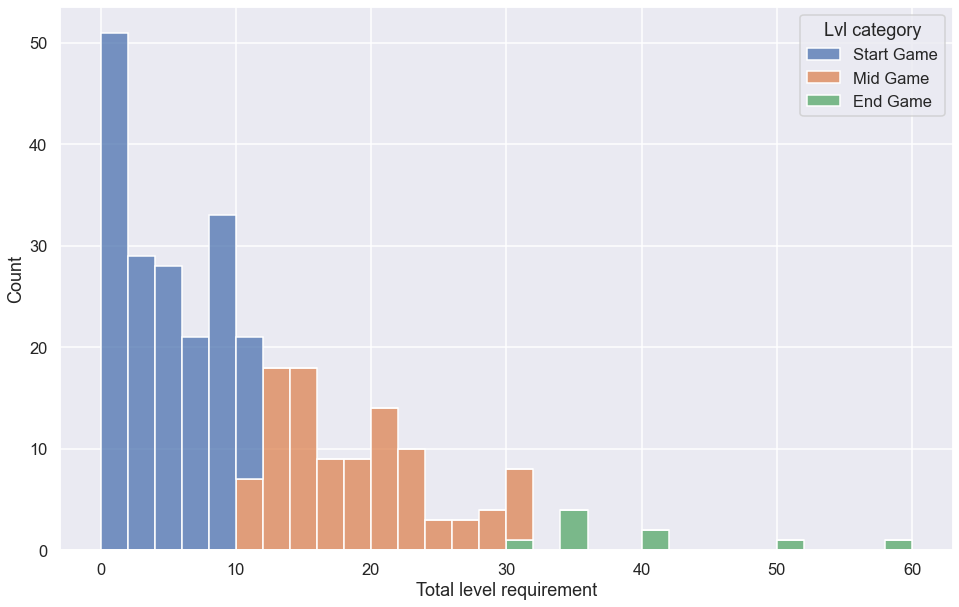

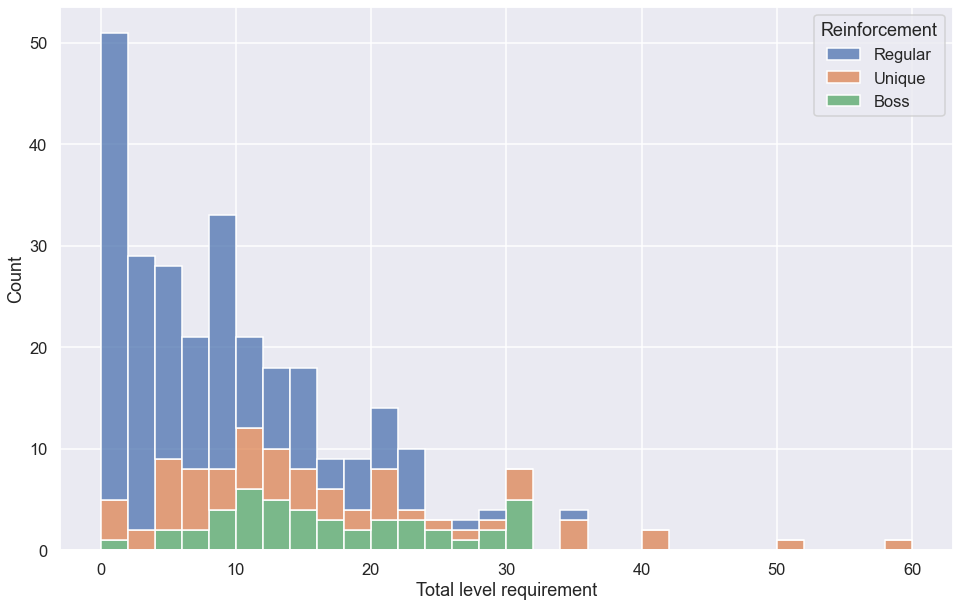

In [83]:
plt.figure(figsize=(16, 10))
sns.histplot(data=df, x='Total Lvl Requirement', hue='Lvl category', multiple="stack", bins=30)
plt.xlabel('Total level requirement')

plt.figure(figsize=(16, 10))
sns.histplot(data=df, x='Total Lvl Requirement', hue='Reinforcement',multiple="stack",  bins=30)
plt.xlabel('Total level requirement')

## Reinforcement:


<AxesSubplot:xlabel='Reinforcement', ylabel='Count'>

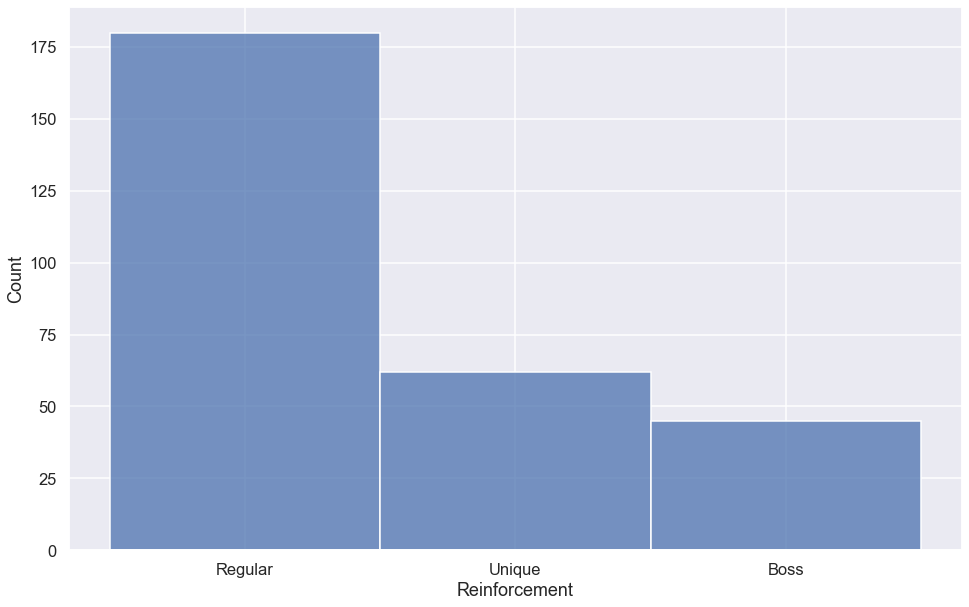

In [84]:
plt.figure(figsize=(16, 10))
sns.histplot(data=df, x='Reinforcement')

## Damage
Physical, Magic, Fire, Lightning, Dark.

<AxesSubplot:xlabel='Total Lvl Requirement', ylabel='Total damage'>

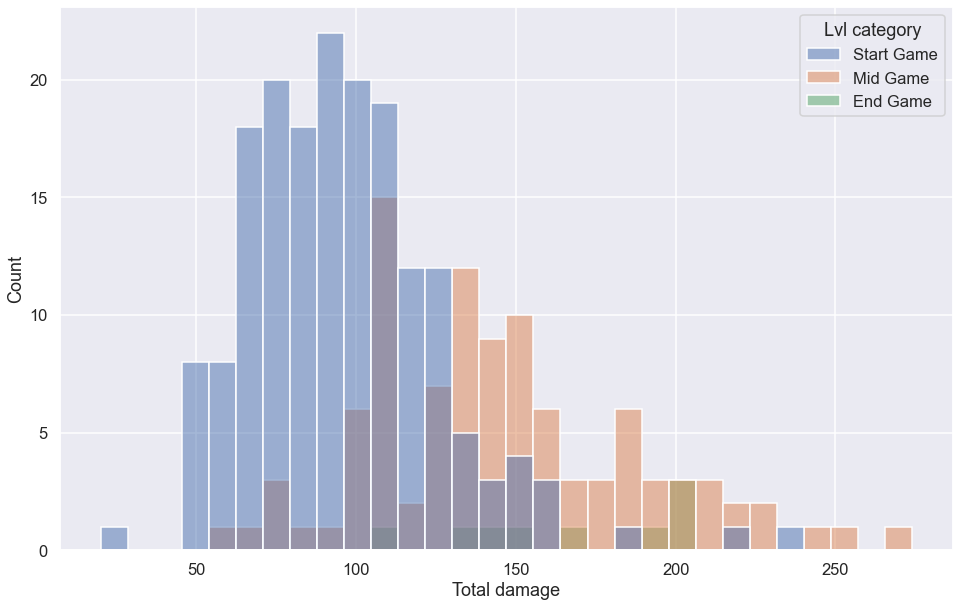

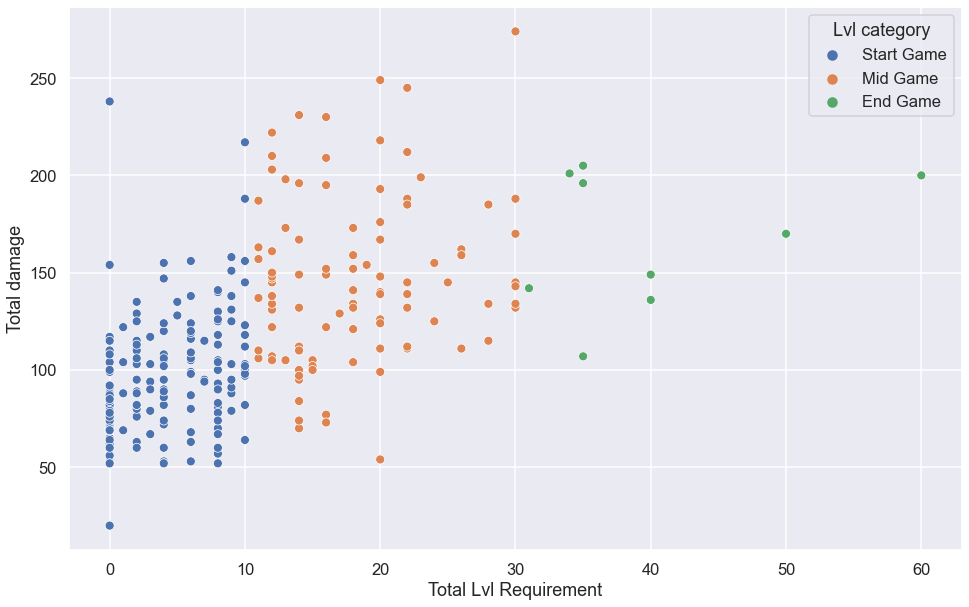

In [85]:
plt.figure(figsize=(16, 10))
sns.histplot(data=df, x='Total damage', hue='Lvl category', bins=30)

plt.figure(figsize=(16, 10))
sns.scatterplot(data=df, y='Total damage', x='Total Lvl Requirement', hue='Lvl category')

We can see that typically, weapons with a low stat requirement have a lower total damage and weapons with a mid range stat requirement tend to have higher total damage.

In [86]:
df.query('`Total damage` >= 200')[['Total damage', 'Total Lvl Requirement', 'Name']]

,Total damage,Total Lvl Requirement,Name
35,209.0,16.0,Twin Princes' Greatsword
40,231.0,14.0,Drakeblood Greatsword
45,217.0,10.0,Firelink Greatsword
46,230.0,16.0,Lorian's Greatsword
54,218.0,20.0,Lothric Knight Greatsword
62,203.0,12.0,Dancer's Enchanted Swords
96,210.0,12.0,Dragonslayer's Axe
102,274.0,30.0,Dragonslayer Greataxe
103,201.0,34.0,Black Knight Greataxe
104,245.0,22.0,Demon's Greataxe


#### Is there a relationship between total damage and lvl investment?

In [87]:
# sklearn modules
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from sklearn.linear_model import LinearRegression

## Remove spell tools?

In [88]:
Staff.describe()
#nonStaff.describe()

,Critical,Weight,Stability,Durability,Spell Buff,Range,Physical damage,Magic damage,Fire damage,Lightning damage,...,Intelligence Bonus Percent,Faith Bonus Percent,Strength Requirement 2 hand,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Total Lvl Requirement 2 hand
count,27.0,27.00,27.00,27.00,27.00,0.0,27.00,27.0,27.00,27.0,...,27.00,27.00,27.00,3.00,0.0,16.00,16.00,1.0,27.00,27.00
mean,100.0,1.35,10.19,51.85,228.30,NaN,63.93,0.0,10.70,0.0,...,45.74,51.67,4.37,3.00,NaN,5.06,5.81,0.0,6.78,6.44
std,0.0,1.09,3.53,7.36,29.57,NaN,25.70,0.0,31.16,0.0,...,43.67,45.91,2.22,1.73,NaN,3.53,5.47,NaN,5.38,5.36
min,100.0,0.00,0.00,40.00,184.00,NaN,0.00,0.0,0.00,0.0,...,0.00,0.00,0.00,2.00,NaN,0.00,0.00,0.0,0.00,0.00
25%,100.0,0.50,10.00,45.00,207.50,NaN,52.50,0.0,0.00,0.0,...,0.00,0.00,3.00,2.00,NaN,2.00,2.00,0.0,4.00,4.00
50%,100.0,0.50,10.00,50.00,224.00,NaN,60.00,0.0,0.00,0.0,...,35.00,65.00,4.00,2.00,NaN,4.00,4.00,0.0,6.00,4.00
75%,100.0,2.50,10.00,55.00,238.50,NaN,74.00,0.0,0.00,0.0,...,90.00,90.00,6.00,3.50,NaN,8.00,8.00,0.0,8.00,8.00
max,100.0,3.00,15.00,65.00,312.00,NaN,120.00,0.0,110.00,0.0,...,120.00,120.00,10.00,5.00,NaN,14.00,20.00,0.0,20.00,20.00


Xdata = Total lvl requirement
Ydata = Total damage

<function matplotlib.pyplot.show(close=None, block=None)>

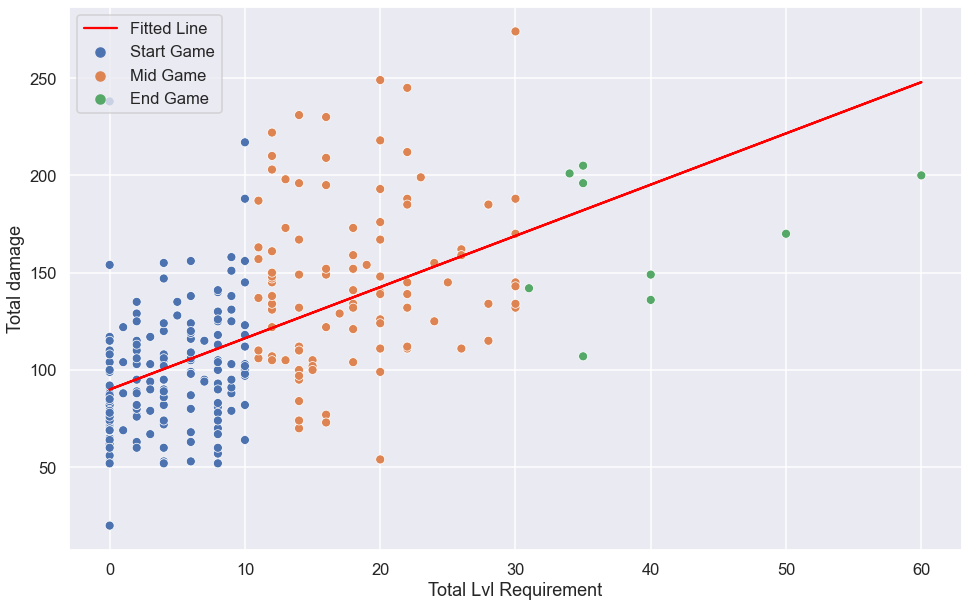

In [89]:
# Set data.
X = df[['Total Lvl Requirement']]
Y = df['Total damage']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()


# Fit the model to the training data
model.fit(X_train, y_train)


#Make predictions using the test data
y_pred = model.predict(X_test)


# Plotting
plt.figure(figsize=(16, 10))
sns.scatterplot(data=df, y='Total damage', x='Total Lvl Requirement', hue='Lvl category')
plt.plot(X, model.predict(X), color='red', label='Fitted Line')  # Fitted line

plt.legend(loc='upper left')
plt.show


In [90]:
print(f'The gradient of the line of best fit is{model.coef_[0] : .1f} damage/lvl')  #m
print(f'{model.intercept_ : .1f}') #c

The gradient of the line of best fit is 2.6 damage/lvl
 89.9


An issue with using lvl requirement is that all weapons with requirments of 10 truncate the prediction at the y axis. Better to compare weapon scaling with stat requirement directly. Expect answer to be similar.

In [91]:
df['Total Stat Requirement'] = df[['Strength Requirement', "Dexterity Requirement",
                  'Intelligence Requirement', 'Faith Requirement']].sum(axis=1)
df['Total Stat Requirement']

0      18.0
1      28.0
2      28.0
3      14.0
4      12.0
       ... 
282    21.0
283    33.0
284    13.0
285    34.0
286     5.0
Name: Total Stat Requirement, Length: 287, dtype: float64

The gradient of the line of best fit is 2.1 total_damage/stat
 57.5


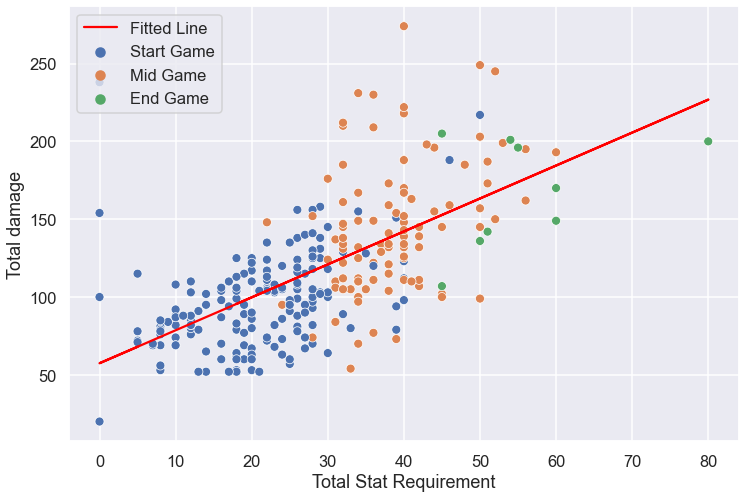

In [92]:
# Set data.
X = df[['Total Stat Requirement']]
Y = df['Total damage']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()


# Fit the model to the training data
model.fit(X_train, y_train)


#Make predictions using the test data
y_pred = model.predict(X_test)


# Plotting
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, y='Total damage', x='Total Stat Requirement', hue='Lvl category')
plt.plot(X, model.predict(X), color='red', label='Fitted Line')  # Fitted line
#plt.xlabel()

plt.legend(loc='upper left')
plt.show

print(f'The gradient of the line of best fit is{model.coef_[0] : .1f} total_damage/stat')  #m
print(f'{model.intercept_ : .1f}') #c

Note

In [93]:
# y = mx + c
# x = (y-c)/m
y_target = 90
x_pred = (y_target - model.intercept_ )/ model.coef_[0] 
print(f'For a weapon of strength {y_target}, the predicted total stat requirement is {x_pred :.1f}')

For a weapon of strength 90, the predicted total stat requirement is 15.4


Scaling our damage

In [94]:
#df['Scaled physical'] = df[['Physical damage']*df['Str bonus']

'''
df['Scaled damage'] = df[['Physical damage', "Magic damage", 'Fire damage', 'Lightning damage', 'Dark damage']].sum(axis=1)
df[['Scaled damage', 'Physical damage']].describe()
'''
#df[['Physical damage', 'Scaled physical', 'Dex bonus']]

'\ndf[\'Scaled damage\'] = df[[\'Physical damage\', "Magic damage", \'Fire damage\', \'Lightning damage\', \'Dark damage\']].sum(axis=1)\ndf[[\'Scaled damage\', \'Physical damage\']].describe()\n'

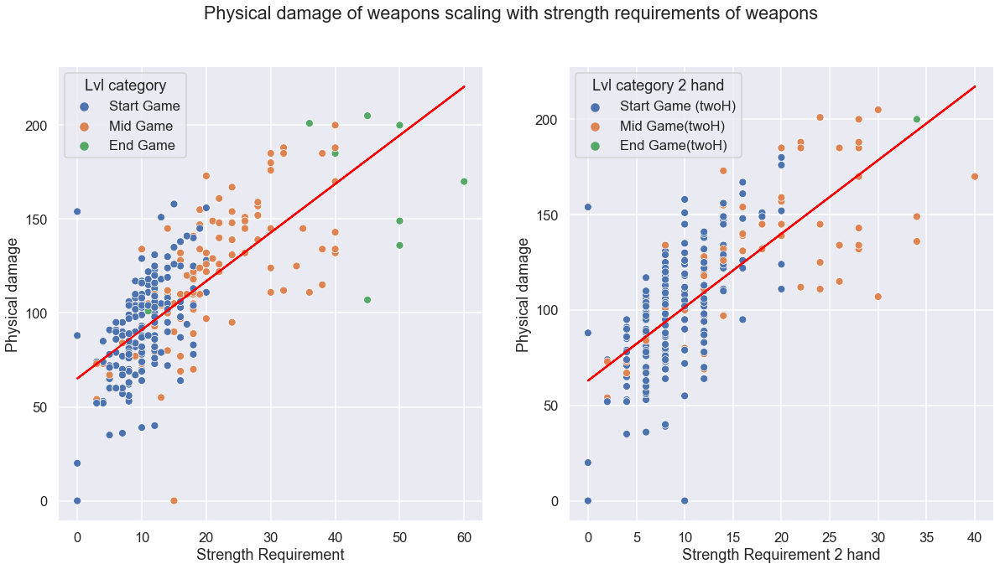

The gradient of the line of best fit is 2.6 damage/stat for one handing the weapon
 65.1
The gradient of the line of best fit is 3.9 damage/stat for two handing the weapon
 63.0


In [95]:
def scatter(X, Y):
    # Set data.
    #X = df[['Column1']]
    #Y = df['Column2']


    # Create a linear regression model
    model = LinearRegression()


    # Fit the model to the training data
    model.fit(X, Y)


    #Make predictions using the test data
    y_pred = model.predict(X)
    m = model.coef_[0]
    c = model.intercept_ 
    
    return(X, y_pred, m, c)

X1, y1_pred, m1, c1 = scatter(df[['Strength Requirement']], df['Physical damage'])
X2, y2_pred, m2, c2 = scatter(df[['Strength Requirement 2 hand']], df['Physical damage'])



# Create a figure and subplot grid
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))  # 1 row, 1 column, creating 1 subplot

# Scatter plot using seaborn
sns.scatterplot(data=df, y='Physical damage', x='Strength Requirement', hue='Lvl category', ax=ax1)
# Line plot using matplotlib
ax1.plot(X1, y1_pred, color='red', label='Fitted Line')  # Fitted line


sns.scatterplot(data=df, y='Physical damage', x='Strength Requirement 2 hand', hue='Lvl category 2 hand', ax=ax2)
ax2.plot(X2, y2_pred, color='red', label='Fitted Line')  # Fitted line


# Adding an overall title.
fig.suptitle('Physical damage of weapons scaling with strength requirements of weapons')

# Display legend
#ax.legend()

# Show the plot
plt.show()

print(f'The gradient of the line of best fit is{m1 : .1f} damage/stat for one handing the weapon')  #m
print(f'{c1 : .1f}') #c

print(f'The gradient of the line of best fit is{m2 : .1f} damage/stat for two handing the weapon')  #m
print(f'{c2 : .1f}') #c

#### Dexterity

The gradient of the line of best fit is 0.3 damage/stat
 105.2


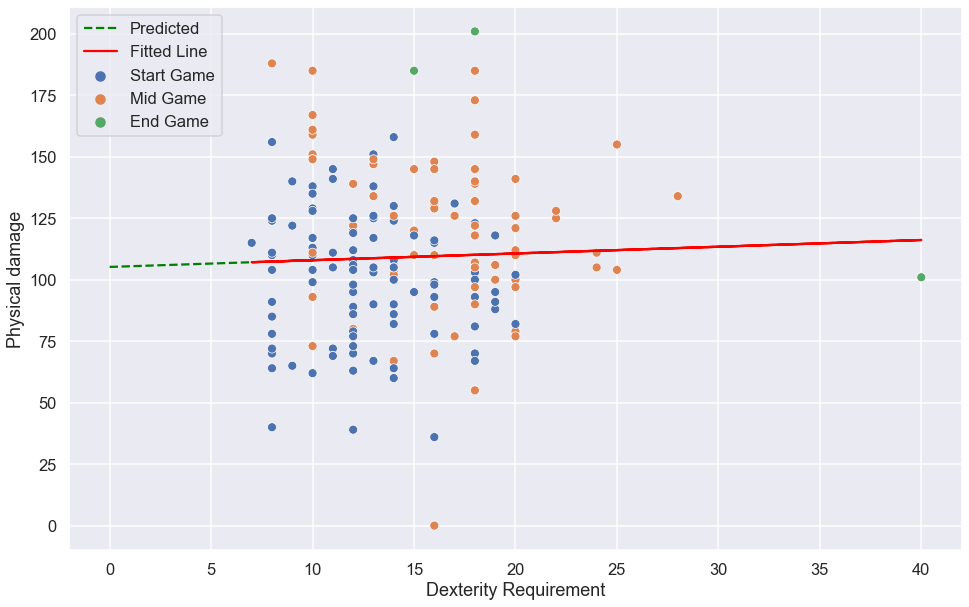

In [96]:
# Filter out rows where X == 0 while keeping original dataset intact
df_filtered = df[df['Dexterity Requirement'] != 0]

X = df_filtered[['Dexterity Requirement']]
Y = df_filtered['Physical damage']

# Split data into training and test sets
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_train, y_train = X, Y
# Create a linear regression model
model = LinearRegression()


# Fit the model to the training data
model.fit(X_train, y_train)


# Predict Y values using the fitted model (for plotting)
X_range = np.linspace(0, X.max(), 100).reshape(-1, 1)  # Create a range for X values
Y_pred = model.predict(X_range)  # Predict corresponding Y values for the range


# Set figure window:
plt.figure(figsize=(16, 10))

# Plot data point:
sns.scatterplot(data=df_filtered, y='Physical damage', x='Dexterity Requirement', hue='Lvl category')

# Extend the line to the Y-axis (intercept):
plt.plot( X_range, Y_pred, color='green', linestyle='--', label='Predicted')

# Plot fitted line above predicted line
plt.plot(X, model.predict(X), color='red', label='Fitted Line')  # Fitted line



plt.legend(loc='upper left')
plt.show



print(f'The gradient of the line of best fit is{model.coef_[0] : .1f} damage/stat')  #m
print(f'{model.intercept_ : .1f}') #c


The gradient of the line of best fit is 0.8 damage/stat
 96.9


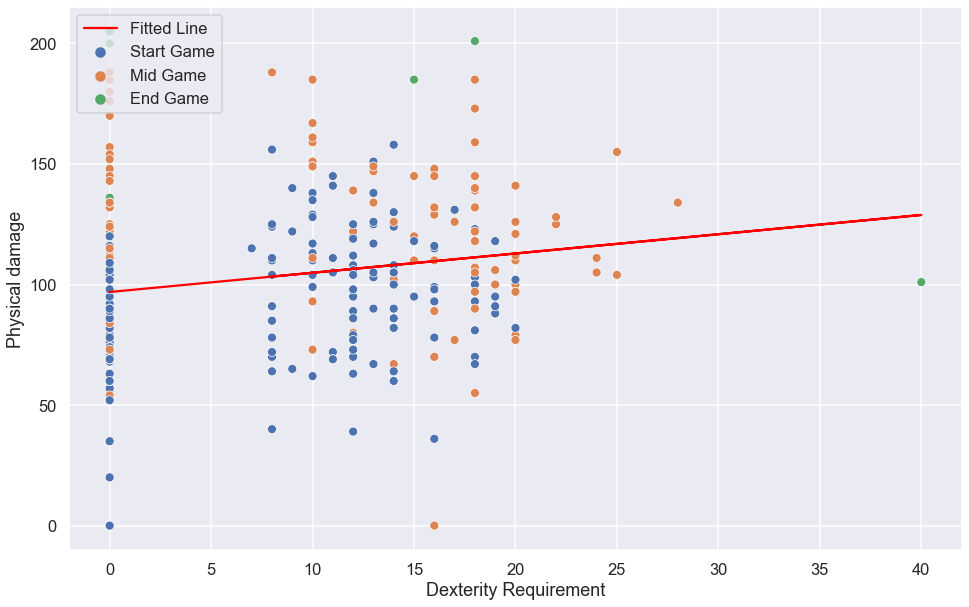

In [97]:
X3, y3_pred, m3, c3 = scatter(df[['Dexterity Requirement']], df['Physical damage'])



# Set figure window:
plt.figure(figsize=(16, 10))

# Plot data point:
sns.scatterplot(data=df, y='Physical damage', x='Dexterity Requirement', hue='Lvl category')

# Extend the line to the Y-axis (intercept):
#plt.plot( X_range, Y_pred, color='green', linestyle='--', label='Predicted')

# Plot fitted line above predicted line
plt.plot(X3, y3_pred, color='red', label='Fitted Line')  # Fitted line



plt.legend(loc='upper left')
plt.show



print(f'The gradient of the line of best fit is{m3 : .1f} damage/stat')  #m
print(f'{c3 : .1f}') #c

The gradient of the line of best fit is 1.2 damage/stat
 0.9


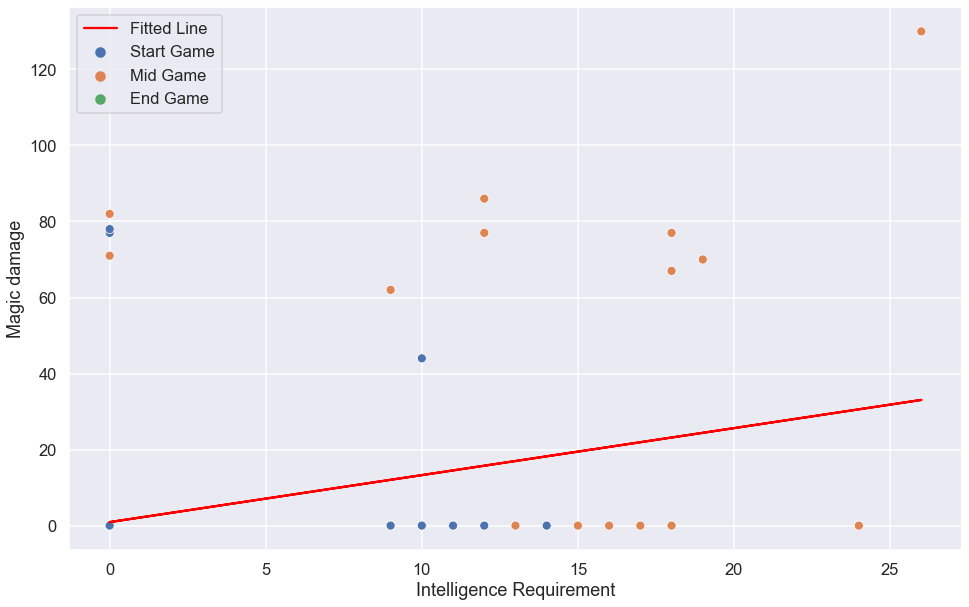

In [98]:
X4, y4_pred, m4, c4 = scatter(df[['Intelligence Requirement']], df['Magic damage'])



# Set figure window:
plt.figure(figsize=(16, 10))

# Plot data point:
sns.scatterplot(data=df, y='Magic damage', x='Intelligence Requirement', hue='Lvl category')

# Extend the line to the Y-axis (intercept):
#plt.plot( X_range, Y_pred, color='green', linestyle='--', label='Predicted')

# Plot fitted line above predicted line
plt.plot(X4, y4_pred, color='red', label='Fitted Line')  # Fitted line



plt.legend(loc='upper left')
plt.show



print(f'The gradient of the line of best fit is{m4 : .1f} damage/stat')  #m
print(f'{c4 : .1f}') #c

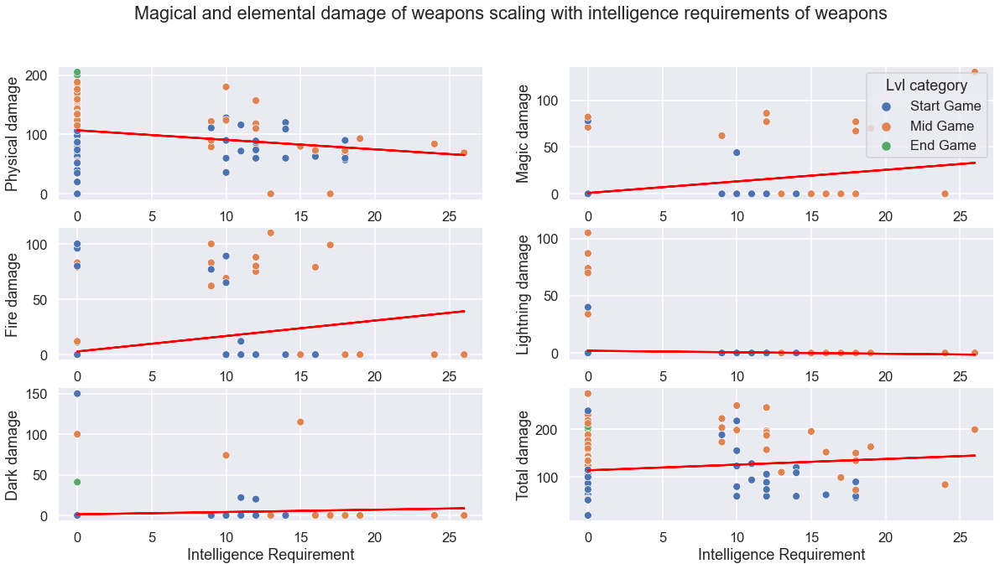

The gradient of the line of best fit is-1.6 Physical damage/stat
 107.0
The gradient of the line of best fit is 1.2 Magic damage/stat
 0.9
The gradient of the line of best fit is 1.4 Fire damage/stat
 2.8
The gradient of the line of best fit is-0.1 Lightning damage/stat
 1.9
The gradient of the line of best fit is 0.3 Dark damage/stat
 1.3
The gradient of the line of best fit is 1.2 Total damage/stat
 113.9


In [100]:
X0, y0_pred, m0, c0 = scatter(df[['Intelligence Requirement']], df['Physical damage'])
X1, y1_pred, m1, c1 = scatter(df[['Intelligence Requirement']], df['Magic damage'])
X2, y2_pred, m2, c2 = scatter(df[['Intelligence Requirement']], df['Fire damage'])
X3, y3_pred, m3, c3 = scatter(df[['Intelligence Requirement']], df['Lightning damage'])
X4, y4_pred, m4, c4 = scatter(df[['Intelligence Requirement']], df['Dark damage'])
X5, y5_pred, m5, c5 = scatter(df[['Intelligence Requirement']], df['Total damage'])


# Create a figure and subplot grid
fig, axs = plt.subplots(3,2, figsize=(20,10))  # 3 row, 2 column, creating 6 subplot

#Plot scatter plots and plots on subplot
sns.scatterplot(data=df, y='Physical damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[0,0], legend=False)
axs[0,0].plot(X0, y0_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Magic damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[0,1], legend=True)
axs[0,1].plot(X1, y1_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Fire damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[1,0], legend=False)
axs[1,0].plot(X2, y2_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Lightning damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[1,1], legend=False)
axs[1,1].plot(X3, y3_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Dark damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[2,0],  legend=False)
axs[2,0].plot(X4, y4_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Total damage', x='Intelligence Requirement', hue='Lvl category', ax=axs[2,1], legend=False)
axs[2,1].plot(X5, y5_pred, color='red', label='Fitted Line')  # Fitted line


# Adding an overall title.
fig.suptitle('Magical and elemental damage of weapons scaling with intelligence requirements of weapons')

# Display legend
#ax.legend()

# Show the plot
plt.show()

print(f'The gradient of the line of best fit is{m0 : .1f} Physical damage/stat')  #m
print(f'{c0 : .1f}') #c

print(f'The gradient of the line of best fit is{m1 : .1f} Magic damage/stat')  #m
print(f'{c1 : .1f}') #c

print(f'The gradient of the line of best fit is{m2 : .1f} Fire damage/stat')  #m
print(f'{c2 : .1f}') #c

print(f'The gradient of the line of best fit is{m3 : .1f} Lightning damage/stat')  #m
print(f'{c3 : .1f}') #c

print(f'The gradient of the line of best fit is{m4 : .1f} Dark damage/stat')  #m
print(f'{c4 : .1f}') #c

print(f'The gradient of the line of best fit is{m5 : .1f} Total damage/stat')  #m
print(f'{c5 : .1f}') #c

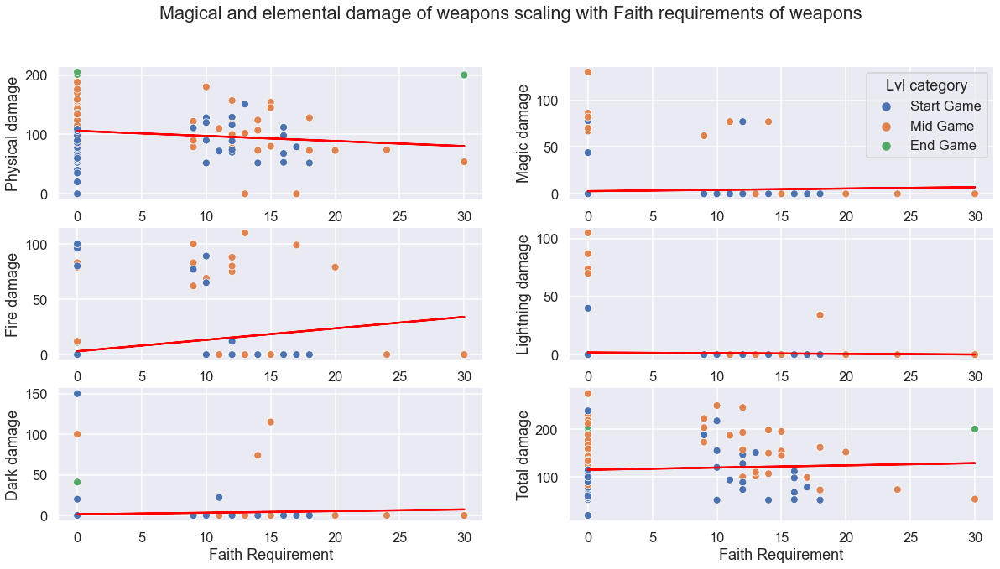

The gradient of the line of best fit is-0.9 Physical damage/stat
 106.0
The gradient of the line of best fit is 0.1 Magic damage/stat
 2.9
The gradient of the line of best fit is 1.0 Fire damage/stat
 3.0
The gradient of the line of best fit is-0.1 Lightning damage/stat
 1.8
The gradient of the line of best fit is 0.2 Dark damage/stat
 1.4
The gradient of the line of best fit is 0.5 Total damage/stat
 115.1


In [101]:
X0, y0_pred, m0, c0 = scatter(df[['Faith Requirement']], df['Physical damage'])
X1, y1_pred, m1, c1 = scatter(df[['Faith Requirement']], df['Magic damage'])
X2, y2_pred, m2, c2 = scatter(df[['Faith Requirement']], df['Fire damage'])
X3, y3_pred, m3, c3 = scatter(df[['Faith Requirement']], df['Lightning damage'])
X4, y4_pred, m4, c4 = scatter(df[['Faith Requirement']], df['Dark damage'])
X5, y5_pred, m5, c5 = scatter(df[['Faith Requirement']], df['Total damage'])



# Create a figure and subplot grid
fig, axs = plt.subplots(3,2, figsize=(20,10))  # 3 row, 2 column, creating 6 subplot

#Plot scatter plots and plots on subplot
sns.scatterplot(data=df, y='Physical damage', x='Faith Requirement', hue='Lvl category', ax=axs[0,0], legend=False)
axs[0,0].plot(X0, y0_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Magic damage', x='Faith Requirement', hue='Lvl category', ax=axs[0,1], legend=True)
axs[0,1].plot(X1, y1_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Fire damage', x='Faith Requirement', hue='Lvl category', ax=axs[1,0], legend=False)
axs[1,0].plot(X2, y2_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Lightning damage', x='Faith Requirement', hue='Lvl category', ax=axs[1,1], legend=False)
axs[1,1].plot(X3, y3_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Dark damage', x='Faith Requirement', hue='Lvl category', ax=axs[2,0],  legend=False)
axs[2,0].plot(X4, y4_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Total damage', x='Faith Requirement', hue='Lvl category', ax=axs[2,1], legend=False)
axs[2,1].plot(X5, y5_pred, color='red', label='Fitted Line')  # Fitted line


# Adding an overall title.
fig.suptitle('Magical and elemental damage of weapons scaling with Faith requirements of weapons')


# Display legend
#ax.legend()

# Show the plot
plt.show()

print(f'The gradient of the line of best fit is{m0 : .1f} Physical damage/stat')  #m
print(f'{c0 : .1f}') #c

print(f'The gradient of the line of best fit is{m1 : .1f} Magic damage/stat')  #m
print(f'{c1 : .1f}') #c

print(f'The gradient of the line of best fit is{m2 : .1f} Fire damage/stat')  #m
print(f'{c2 : .1f}') #c

print(f'The gradient of the line of best fit is{m3 : .1f} Lightning damage/stat')  #m
print(f'{c3 : .1f}') #c

print(f'The gradient of the line of best fit is{m4 : .1f} Dark damage/stat')  #m
print(f'{c4 : .1f}') #c

print(f'The gradient of the line of best fit is{m5 : .1f} Total damage/stat')  #m
print(f'{c5 : .1f}') #c

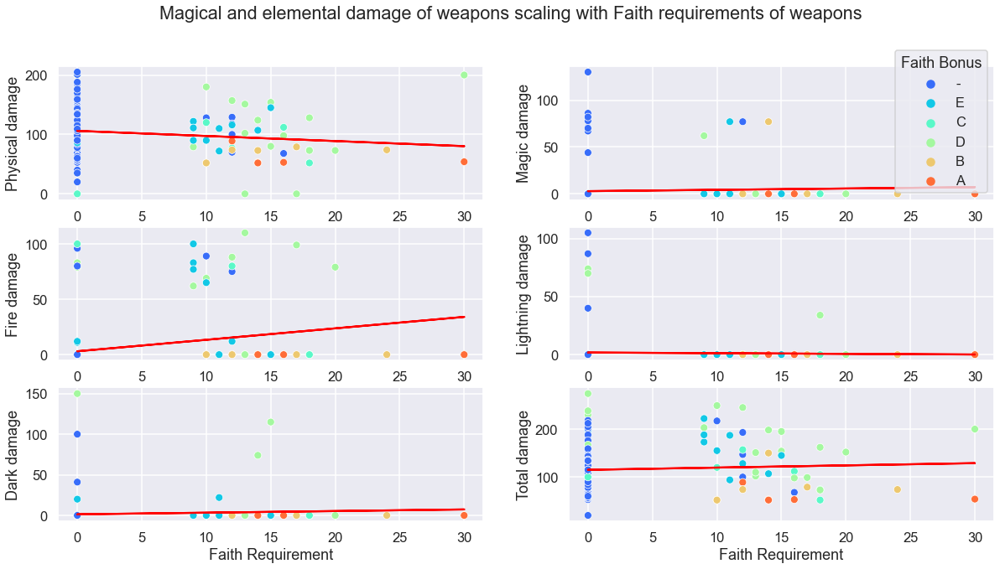

The gradient of the line of best fit is-0.9 Physical damage/stat
 106.0
The gradient of the line of best fit is 0.1 Magic damage/stat
 2.9
The gradient of the line of best fit is 1.0 Fire damage/stat
 3.0
The gradient of the line of best fit is-0.1 Lightning damage/stat
 1.8
The gradient of the line of best fit is 0.2 Dark damage/stat
 1.4
The gradient of the line of best fit is 0.5 Total damage/stat
 115.1


In [102]:
X0, y0_pred, m0, c0 = scatter(df[['Faith Requirement']], df['Physical damage'])
X1, y1_pred, m1, c1 = scatter(df[['Faith Requirement']], df['Magic damage'])
X2, y2_pred, m2, c2 = scatter(df[['Faith Requirement']], df['Fire damage'])
X3, y3_pred, m3, c3 = scatter(df[['Faith Requirement']], df['Lightning damage'])
X4, y4_pred, m4, c4 = scatter(df[['Faith Requirement']], df['Dark damage'])
X5, y5_pred, m5, c5 = scatter(df[['Faith Requirement']], df['Total damage'])



# Create a figure and subplot grid
fig, axs = plt.subplots(3,2, figsize=(20,10))  # 1 row, 1 column, creating 1 subplot
sns.color_palette("tab10", 2)

# want to set colour palette so that the n of colours matches the number of distinct categories
# In this case, want 6 colours for Faith Bonus "- and E to A"
palette = sns.color_palette("rainbow", n_colors= len(df['Faith Bonus'].unique()))

#Plot scatter plots and plots on subplot
sns.scatterplot(data=df, y='Physical damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[0,0],palette = palette, legend=False)
axs[0,0].plot(X0, y0_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Magic damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[0,1], palette = palette,legend=True)
axs[0,1].plot(X1, y1_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Fire damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[1,0], palette = palette,legend=False)
axs[1,0].plot(X2, y2_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Lightning damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[1,1], palette = palette,legend=False)
axs[1,1].plot(X3, y3_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Dark damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[2,0], palette = palette, legend=False)
axs[2,0].plot(X4, y4_pred, color='red', label='Fitted Line')  # Fitted line

sns.scatterplot(data=df, y='Total damage', x='Faith Requirement', hue='Faith Bonus', ax=axs[2,1], palette = palette, legend=False)
axs[2,1].plot(X5, y5_pred, color='red', label='Fitted Line')  # Fitted line


# Adding an overall title.
fig.suptitle('Magical and elemental damage of weapons scaling with Faith requirements of weapons')


# Display legend
#ax.legend()

# Show the plot
plt.show()

print(f'The gradient of the line of best fit is{m0 : .1f} Physical damage/stat')  #m
print(f'{c0 : .1f}') #c

print(f'The gradient of the line of best fit is{m1 : .1f} Magic damage/stat')  #m
print(f'{c1 : .1f}') #c

print(f'The gradient of the line of best fit is{m2 : .1f} Fire damage/stat')  #m
print(f'{c2 : .1f}') #c

print(f'The gradient of the line of best fit is{m3 : .1f} Lightning damage/stat')  #m
print(f'{c3 : .1f}') #c

print(f'The gradient of the line of best fit is{m4 : .1f} Dark damage/stat')  #m
print(f'{c4 : .1f}') #c

print(f'The gradient of the line of best fit is{m5 : .1f} Total damage/stat')  #m
print(f'{c5 : .1f}') #c

In [103]:
X0, y0_pred, m0, c0 = scatter(df[['Faith Requirement']], df['Physical damage'])

Generally, there is no correlation between faith requirement and initial damage of any type.<br>
A point of interest I found was that there is only a singular weapon which requires faith to weild and inflicts lightning damage. 
<br>This was unexpected as lightning damage scales with the faith stat.

In [104]:
df[(df["Lightning damage"] >0) & (df["Faith Requirement"] > 0)]

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand,Total Stat Requirement
144,Dragonslayer Swordspear,Spears,Boss,128/0/0/34/0,55/35/30/30/35,0/0/0,16/22/0/18,D/D/-/D,100,14.5,...,6.0,12.0,NaN,8.0,2.0,26.0,Mid Game,22.0,Mid Game(twoH),56.0


In [105]:
df[(df["Category"] == "Chimes") & (df["Faith Requirement"] > 0)]

,Name,Category,Reinforcement,Damage,Damage Reduction,Aux Effects,Stat Requirements,Stat Bonuses,Critical,Weight,...,Str lvls,Dex lvls,Int lvls,Fai lvls,Str lvls 2 hand,Total Lvl Requirement,Lvl category,Total Lvl Requirement 2 hand,Lvl category 2 hand,Total Stat Requirement
278,Caitha's Chime,Chimes,Unique,74/0/0/0/0,25/15/10/15/20,0/0/0,3/0/12/12,E/-/C/B,100,0.5,...,NaN,NaN,2.0,2.0,NaN,4.0,Start Game,4.0,Start Game (twoH),27.0
279,Cleric's Sacred Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/14,D/-/-/A,100,0.5,...,NaN,NaN,NaN,4.0,NaN,4.0,Start Game,4.0,Start Game (twoH),17.0
280,Sacred Chime of Filianore,Chimes,Unique,74/0/0/0/0,25/15/10/10/15,0/0/0,4/0/0/18,E/-/-/C,100,0.5,...,NaN,NaN,NaN,8.0,NaN,8.0,Start Game,8.0,Start Game (twoH),22.0
281,Crystal Chime,Chimes,Unique,73/0/0/0/0,25/20/10/15/15,0/0/0,3/0/18/18,E/-/D/D,100,0.5,...,NaN,NaN,8.0,8.0,NaN,16.0,Mid Game,16.0,Mid Game(twoH),39.0
282,Saint-tree Bellvine,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/18,E/-/-/C,100,0.5,...,NaN,NaN,NaN,8.0,NaN,8.0,Start Game,8.0,Start Game (twoH),21.0
283,Yorshka's Chime,Chimes,Regular,54/0/0/0/0,25/15/10/20/15,0/0/0,3/0/0/30,D/-/-/A,100,0.5,...,NaN,NaN,NaN,20.0,NaN,20.0,Mid Game,20.0,Mid Game(twoH),33.0
284,Priest's Chime,Chimes,Regular,52/0/0/0/0,25/15/10/15/15,0/0/0,3/0/0/10,E/-/-/B,100,0.5,...,NaN,NaN,NaN,0.0,NaN,0.0,Start Game,0.0,Start Game (twoH),13.0


### Heat map:

There is too much data to go through all in one document.<br>
Using the Heatmap plot, we can check which categories have a linear correlation between them and use this information to decide what data is worth comparing another. 

Drop certain rows from the heat map data for redundency, i.e don't need correlation for both strength requirement AND str level requirement.

In [282]:
df_heat = df.drop(['Str lvls','Dex lvls','Fai lvls','Int lvls', 'Str lvls 2 hand',
                   'Total Lvl Requirement', 'Total Lvl Requirement 2 hand'], axis=1)

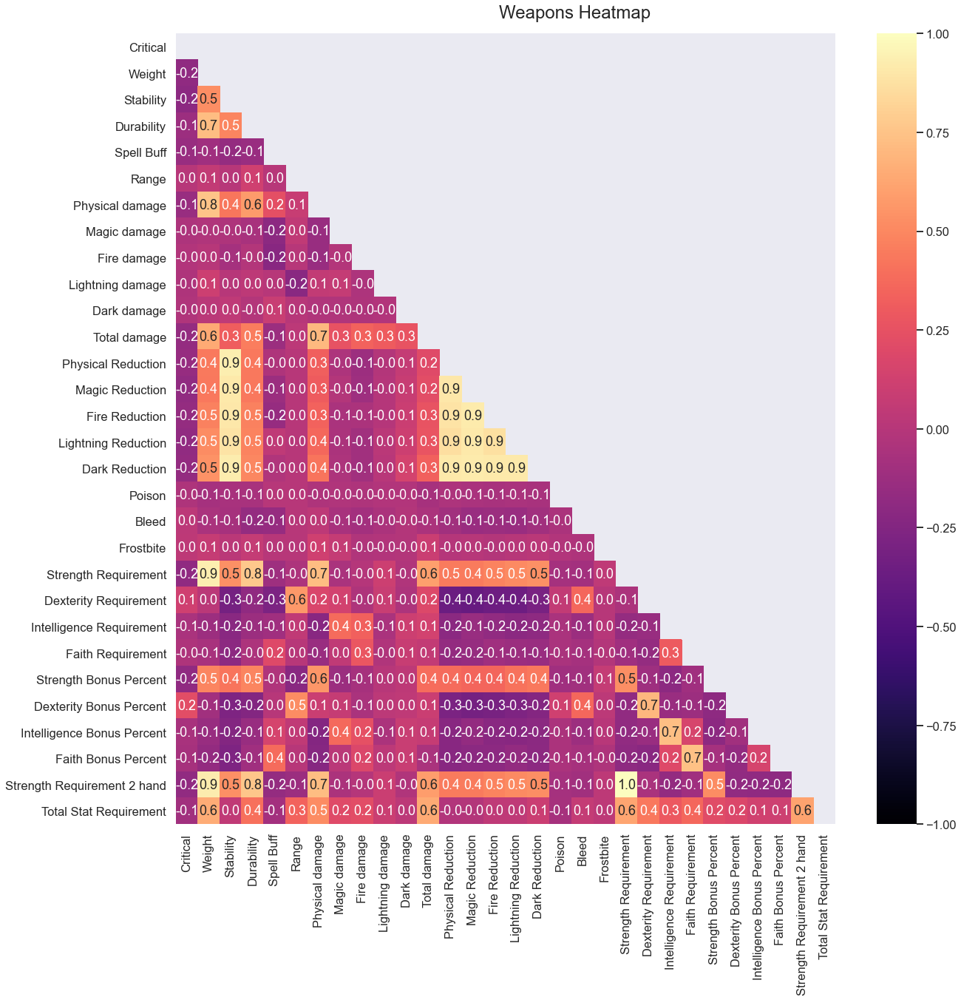

In [283]:
def Plot_Heatmap(data, string):
    df_heat = data.drop(['Str lvls','Dex lvls','Fai lvls','Int lvls', 'Str lvls 2 hand',
                   'Total Lvl Requirement', 'Total Lvl Requirement 2 hand'], axis=1)
    # Calculate the correlation matrix and store it in a variable.
    # Fill in NaN values with 0 (no correlation) to make heatmap easier to read
    #corr = df_heat.corr()
    corr = df_heat.corr().fillna(0)
    #corr = df_heat.replace(0, np.nan).corr()
    corr
    # Generate a mask for the upper triangle and store it in the mask variable.

    # Initialise shape of mask to be identical to shape of corr
    Trimask = np.triu(np.ones(corr.shape), k=0)
    # Setting k = 0 makes explicit that the diagonal is included in the upper triangle mask
    # Want the diagonal to be masked along with the upper tri.

    #print(mask) # Checking mask is as expected
    # Set up the figure.
    fig, ax = plt.subplots(figsize = (20, 18))

    # Plot the correlation matrix as a heatmap
    ax = sns.heatmap(data = corr, mask = Trimask, annot = True, fmt = ".1f", cmap = "magma", vmin=-1, vmax=1,)
    plt.suptitle(string+' Heatmap', fontsize=24)
    plt.subplots_adjust(top=0.95)  
    fig.savefig(string+'_heatmap.png')

Plot_Heatmap(df, 'Weapons')

High linear correlation corresponds to values of 1 or -1.

There is the strongest correlation in the damage reduction categories to a number of other categories.<br>
Each of the damage reduction stats are strongly correlated to each other, this makes sense as a weapon with generally high reduction of one type should have a comparativly high reduction in the others.<br>
Damage reduction of all types strongly correlates with the Stability of the weapon, and so when choosing a shield a player may use the stability of the shield to get a rough estimate of the overall damage reduction.<br>

One issue with using this method is that for stats like aux effects which are only present on a handful of weapons, the correlations are skewed towards zero due to the vast number of zero values.<br>
i.e only 6 weapons have a posion attribute of > 0.<br>
Can get around by plotting heatmaps for each of the groups defined earlier.

So instead of seeing the correlation for the range stat across all 287 weapons, it makes sense to only look at the correlation of range stat for Ranged weapons

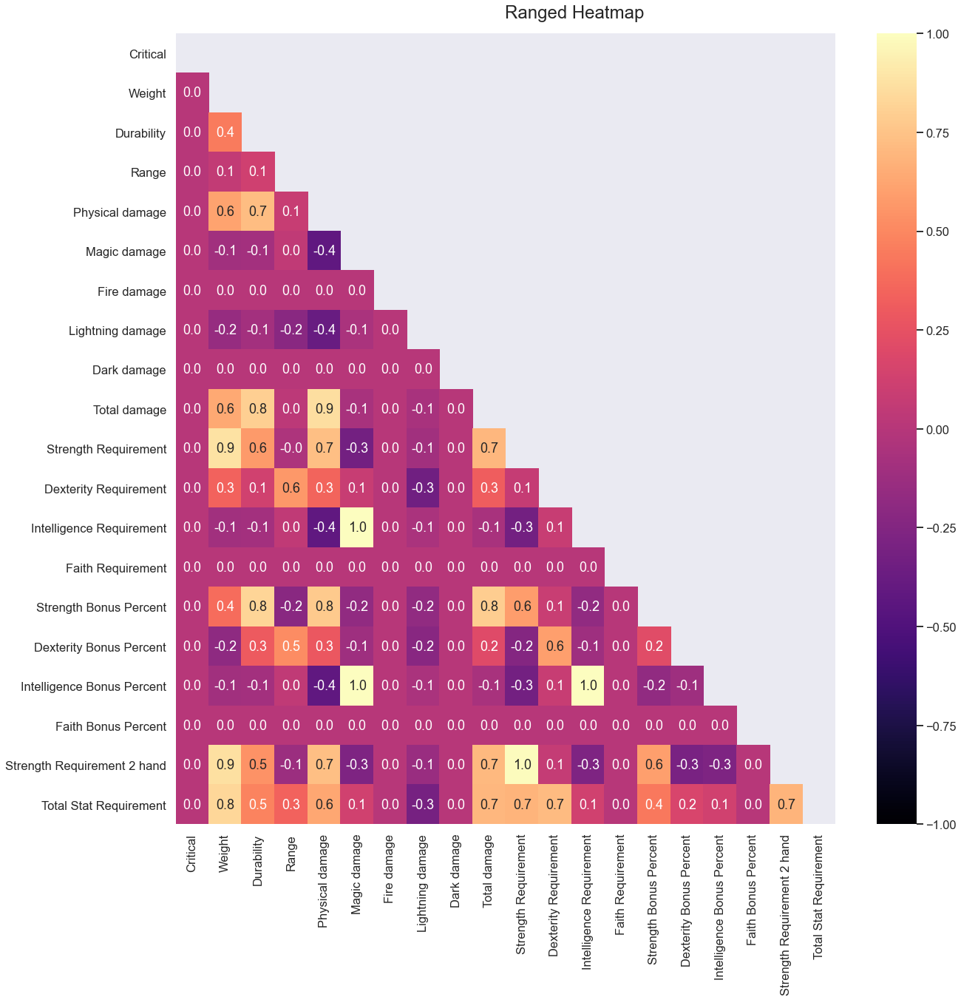

In [284]:
Plot_Heatmap(Ranged, 'Ranged')

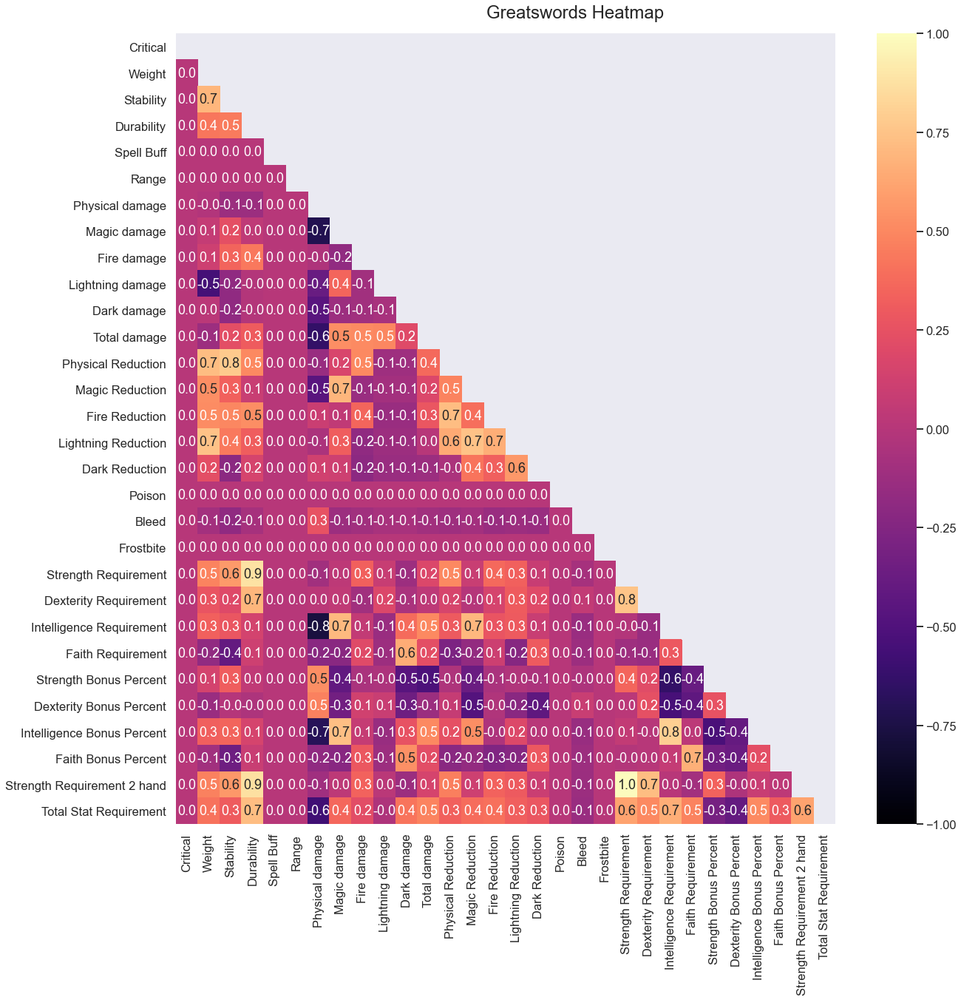

In [285]:
# Could also plot heat Maps for individual weapon categories using this function.

Plot_Heatmap(df[df['Category']=='Greatswords'], 'Greatswords')


In [265]:
df['Category'].unique()

['Daggers', 'Straight Swords', 'Greatswords', 'Ultra Greatswords', 'Curved Swords', ..., 'Staves', 'Pyromancy Flames', 'Talismans', 'Chimes', 'Torches']
Length: 30
Categories (30, object): ['Daggers' < 'Straight Swords' < 'Greatswords' < 'Ultra Greatswords' ... 'Pyromancy Flames' < 'Talismans' < 'Chimes' < 'Torches']

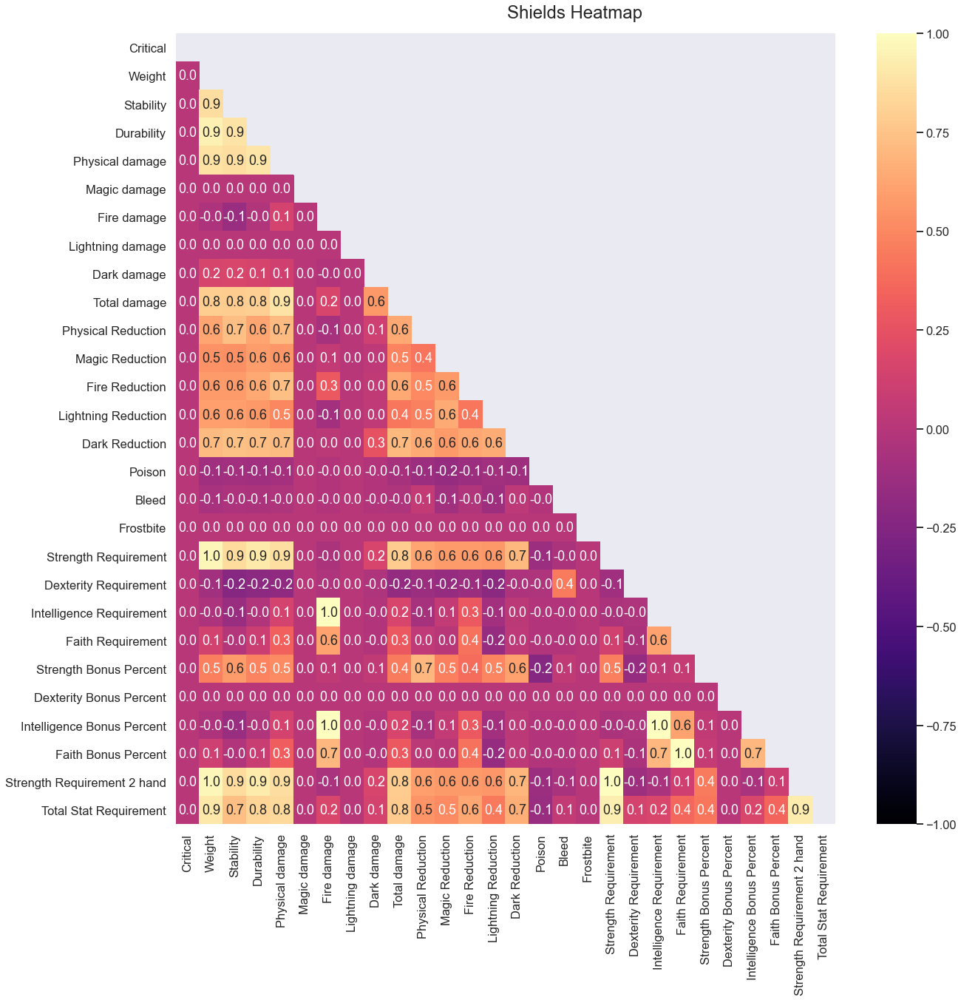

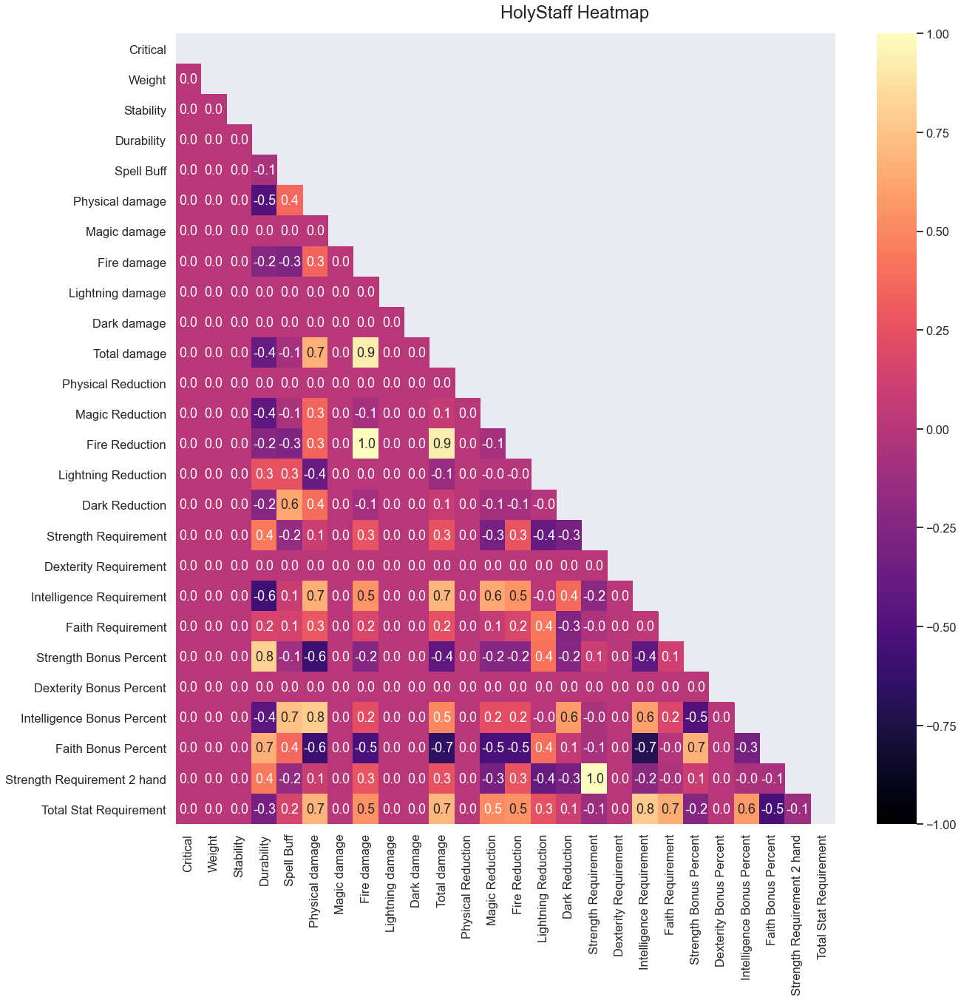

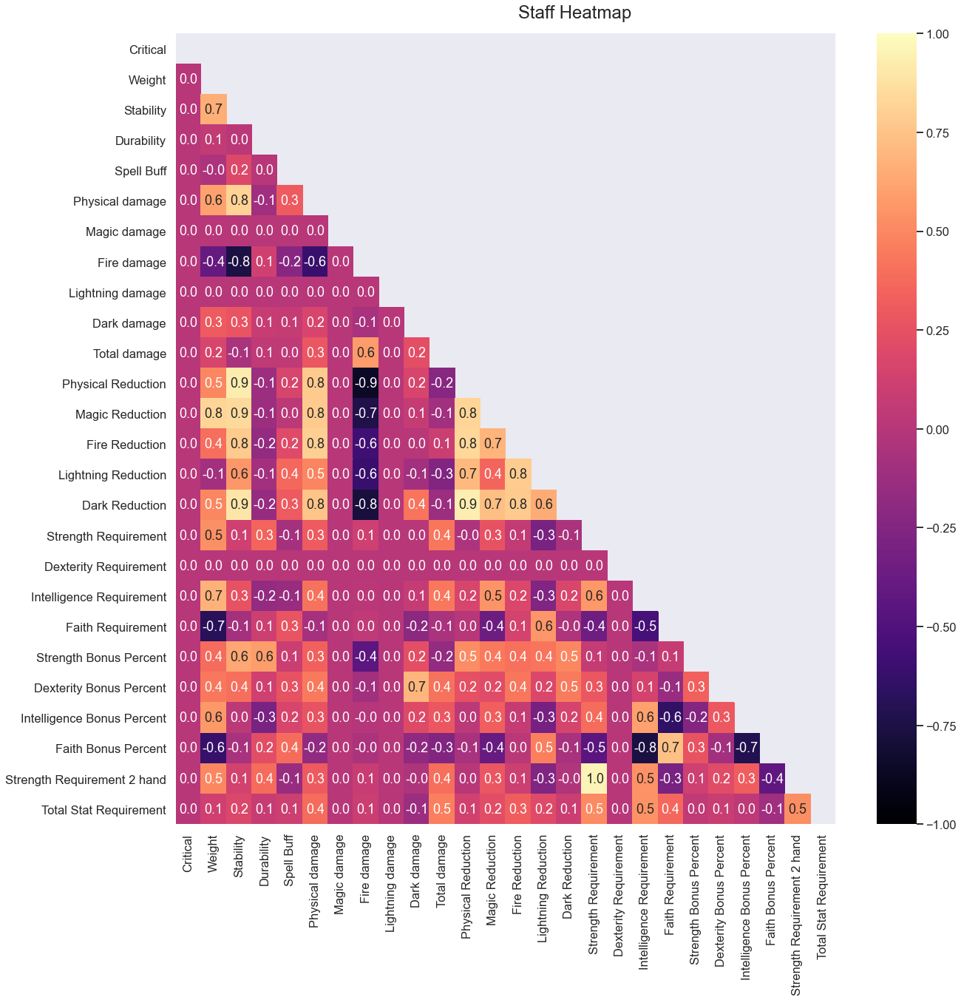

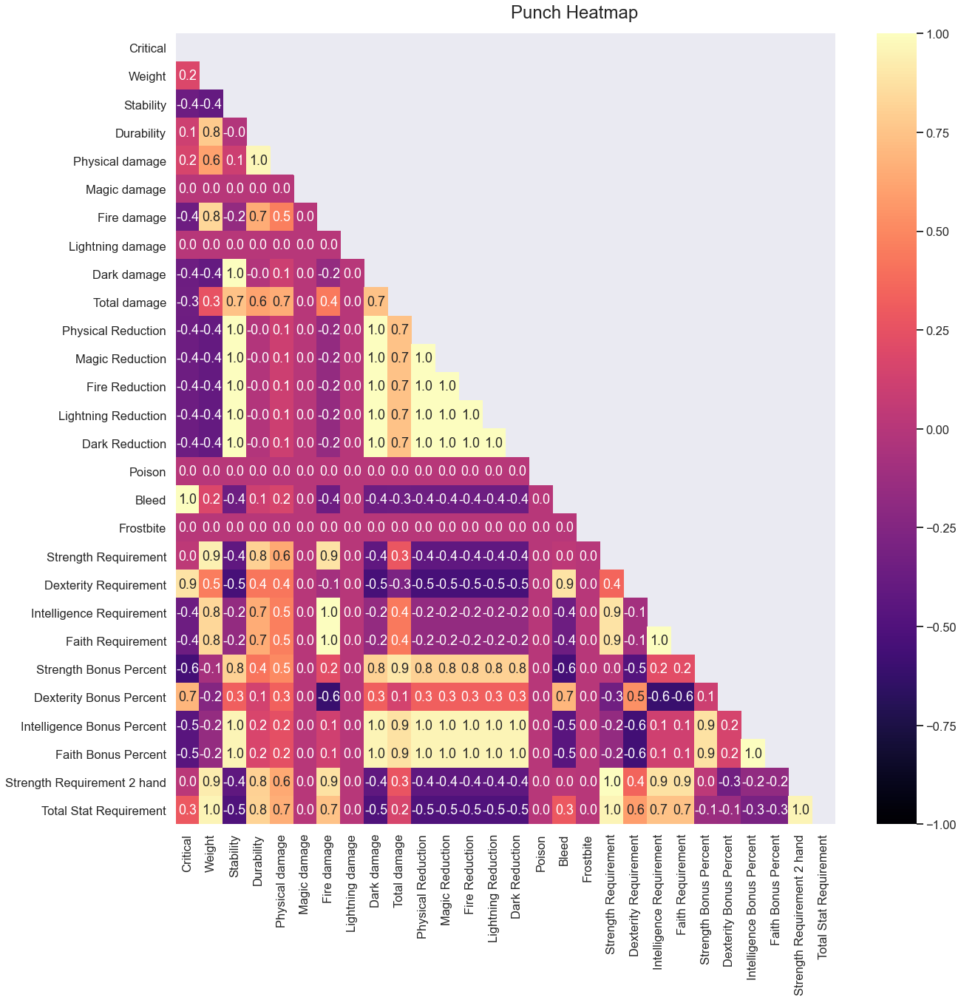

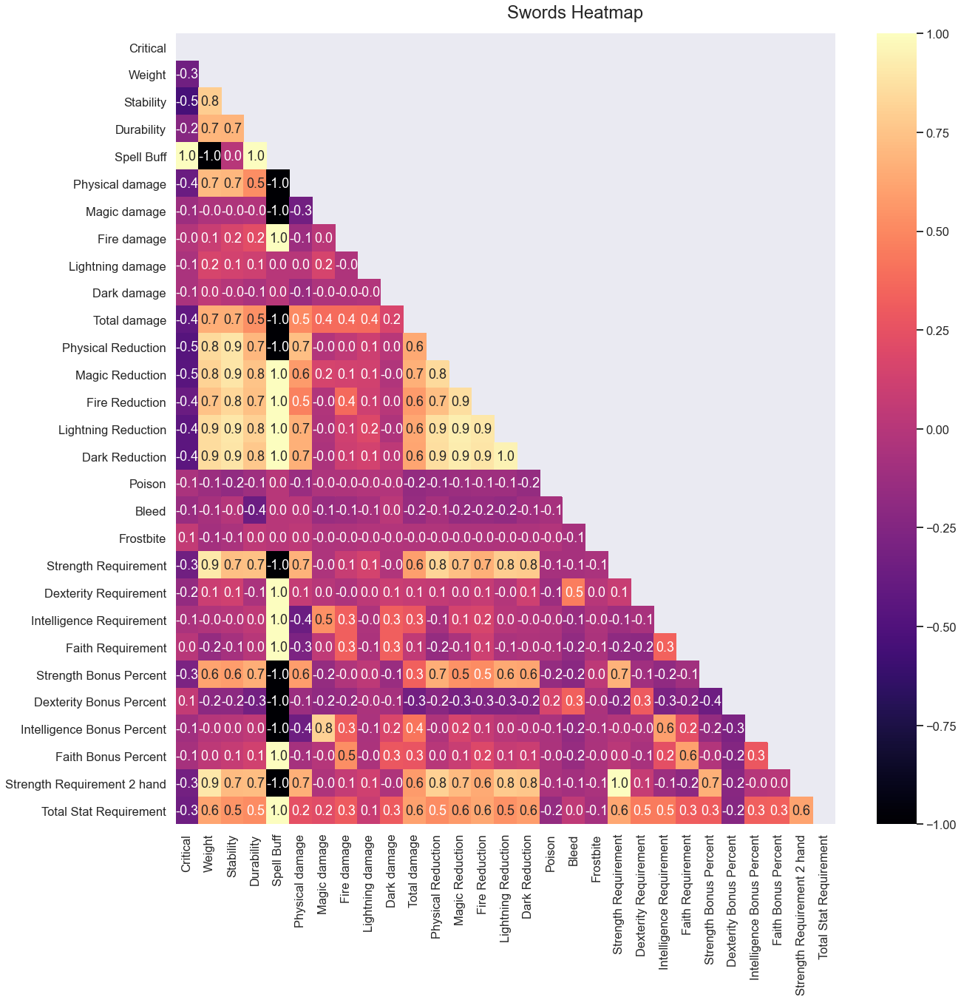

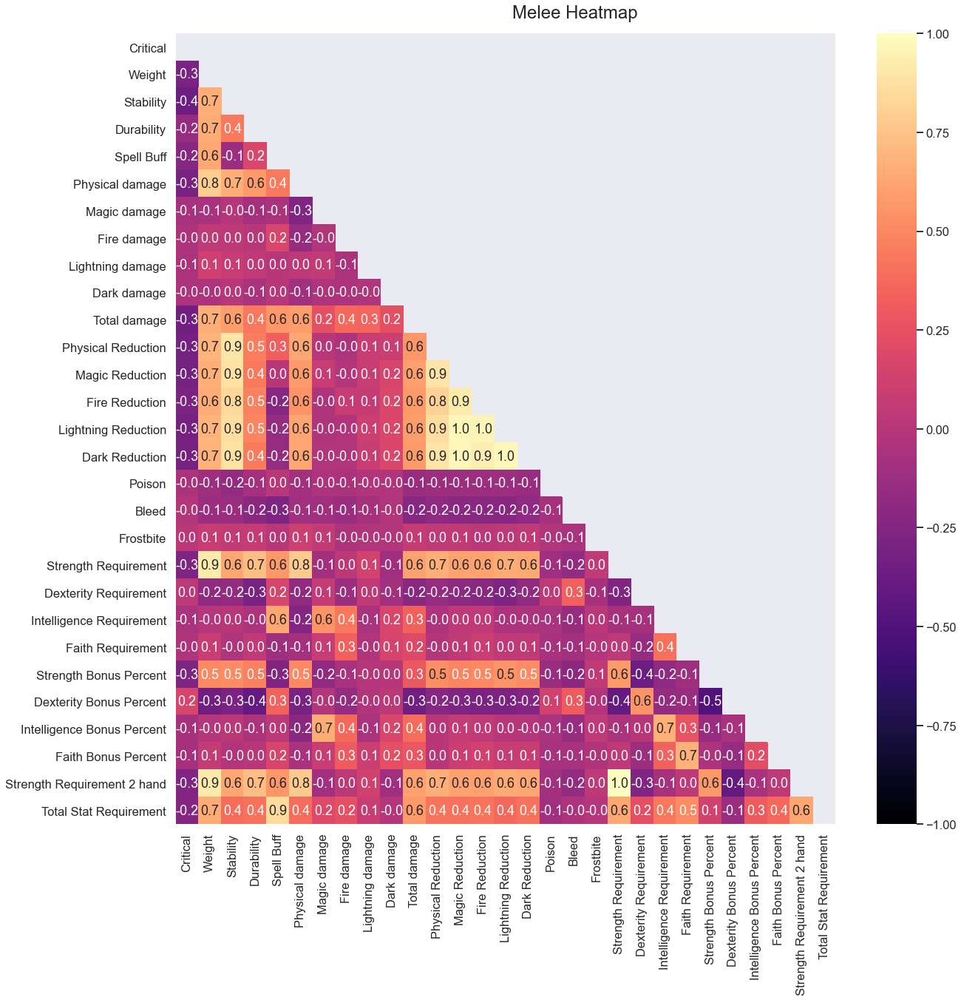

In [286]:
Plot_Heatmap(Shields, 'Shields')
Plot_Heatmap(HolyStaff, 'HolyStaff')
Plot_Heatmap(Staff, 'Staff')
Plot_Heatmap(Punch, 'Punch')
Plot_Heatmap(Swords, 'Swords')
Plot_Heatmap(Melee, 'Melee')

# KEYS!

In [106]:


'''
#df.query('Column > value')[[columns to be displayed]]
df.query('Weight >= 20')[['Weight', 'Category', 'Name']]
'''

'''

2 figures: 


# Defining the figure and axes.
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))

# Creating the pie charts on their respective axes.
Ranger['Category'].value_counts().plot(kind='pie', ax=axes[0])
Shields['Category'].value_counts().plot(kind='pie', ax=axes[1])

# "Removing" the y axis labels.
axes[0].set_ylabel('')
axes[1].set_ylabel('')

# Adding an overall title.
fig.suptitle('Pie charts of type 1 (left) and type 2 (right)')

# Removing unecessary white space.
plt.tight_layout()
'''
df.keys()

Index(['Name', 'Category', 'Reinforcement', 'Damage', 'Damage Reduction',
       'Aux Effects', 'Stat Requirements', 'Stat Bonuses', 'Critical',
       'Weight', 'Stability', 'Durability', 'Spell Buff', 'Range', 'Buffable',
       'Infusable', 'Physical damage', 'Magic damage', 'Fire damage',
       'Lightning damage', 'Dark damage', 'Total damage', 'Physical Reduction',
       'Magic Reduction', 'Fire Reduction', 'Lightning Reduction',
       'Dark Reduction', 'Poison', 'Bleed', 'Frostbite',
       'Strength Requirement', 'Dexterity Requirement',
       'Intelligence Requirement', 'Faith Requirement', 'Strength Bonus',
       'Dexterity Bonus', 'Intelligence Bonus', 'Faith Bonus',
       'Strength Bonus Percent', 'Dexterity Bonus Percent',
       'Intelligence Bonus Percent', 'Faith Bonus Percent',
       'Strength Requirement 2 hand', 'Str lvls', 'Dex lvls', 'Int lvls',
       'Fai lvls', 'Str lvls 2 hand', 'Total Lvl Requirement', 'Lvl category',
       'Total Lvl Requirement 2 hand